Композиционные материалы — это искусственно созданные материалы, состоящие из нескольких других с четкой границей между ними. Композиты обладают теми свойствами, которые не наблюдаются у компонентов по отдельности. При этом композиты являются монолитным материалом, т. е. компоненты материала неотделимы друг от друга без разрушения конструкции в целом.

#### Этот блокнот содержит краткий исследовательский анализ  набора данных объединённого в один из "X_bp-базальтопластик" и "X_nup-углепластик"  и подборку моделей, обученных предсказывать модуль упругости при растяжении и прочности при растяжении. Так же нейронную сеть, которая будет рекомендовать соотношение матрица-наполнитель

##                                        Разведочный анализ данных 

#### Целью является выполнение краткого анализа данных и определения свойств переменных и взаимосвязей между ними.

## Очистка данных и трансформация переменных

#### Очистка данных и проектирование переменных, затем полученная информация будет использоваться  таким образом, чтобы повысить производительность моделей.

## Далее были обучены 5 моделей:

#### •Ridge regression

#### •Lasso regression

#### •GradientBoostingRegressor

#### •RandomForestRegressor

#### •Neural Network

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from scipy import stats
from sklearn.preprocessing import MinMaxScaler, PowerTransformer
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

#### Загрузка данных и базовое исследование

In [8]:
X_nup = pd.read_excel('X_nup.xlsx')
X_nup.head()

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.0,57.0
1,1,0,4.0,60.0
2,2,0,4.0,70.0
3,3,0,5.0,47.0
4,4,0,5.0,57.0


In [9]:
X_bp = pd.read_excel("X_bp.xlsx")
X_bp.head()

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


#### Объединение  по индексу тип объединения INNER

In [11]:
df=pd.merge(X_bp,X_nup, how='inner', on=None, left_on=None, right_on=None, left_index=False, right_index=False)
df.head()

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [12]:
df = df.drop('Unnamed: 0', 1) # удалим не информативный столбец

C:\Users\rina\AppData\Local\Temp\ipykernel_9100\2527534737.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df = df.drop('Unnamed: 0', 1) # удалим не информативный столбец


In [13]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [226]:
df.shape

(1023, 13)

#### Проверим на пропуски 

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [228]:
# Пропусков нет и все переменные содержат значения float64

#### Гистограммы распределения , диаграммы размаха "ящик с усами", граффики квантиль-квантиль

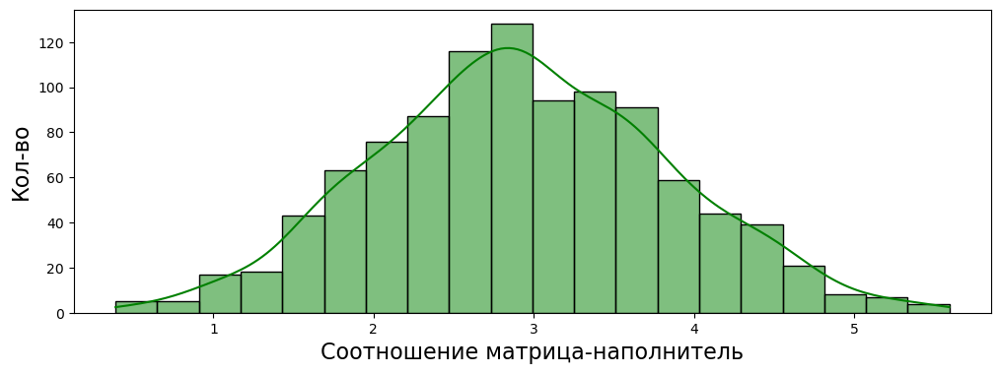

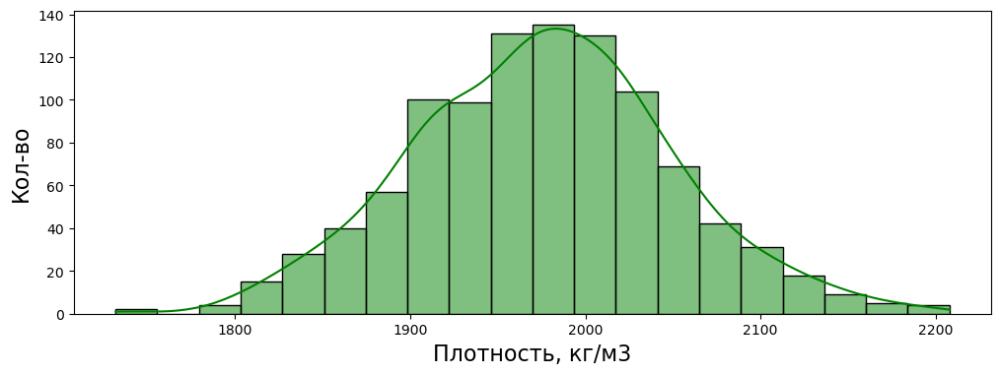

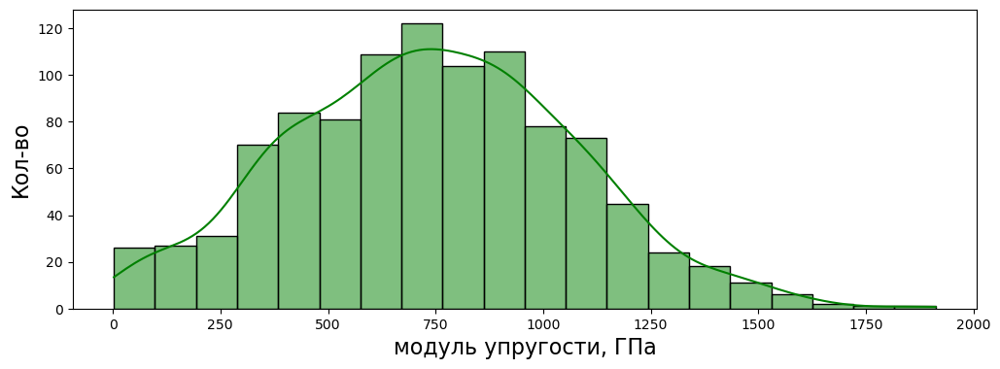

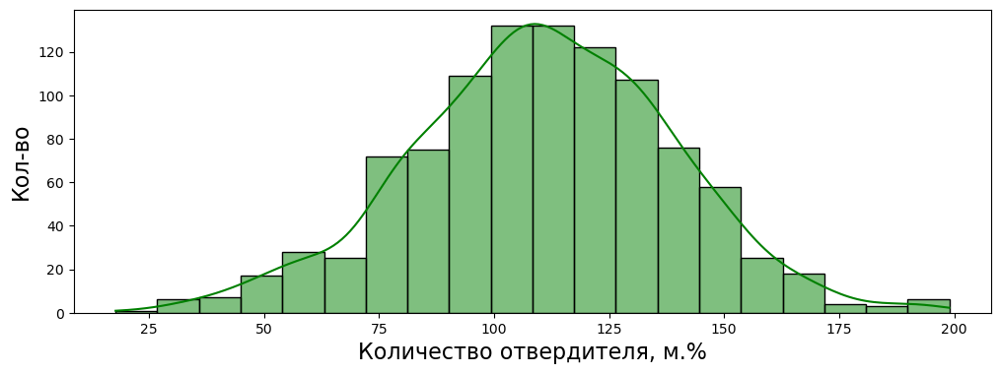

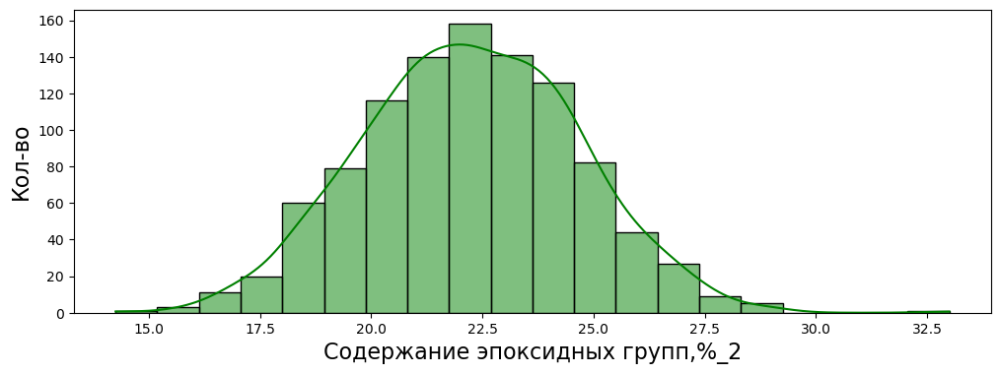

...

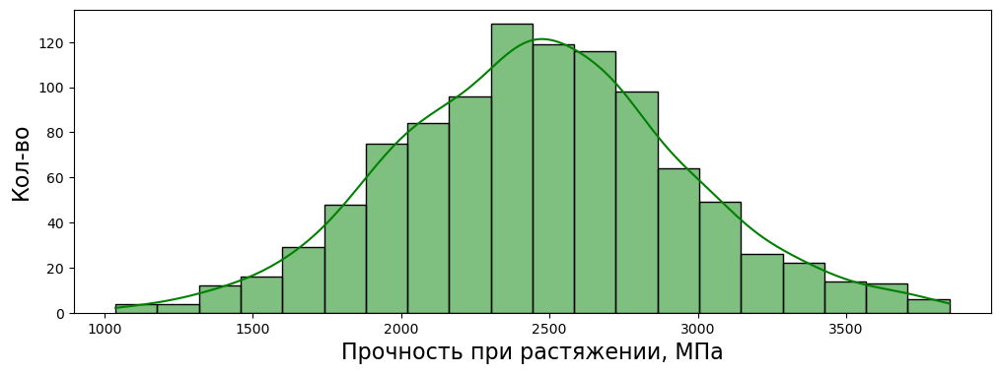

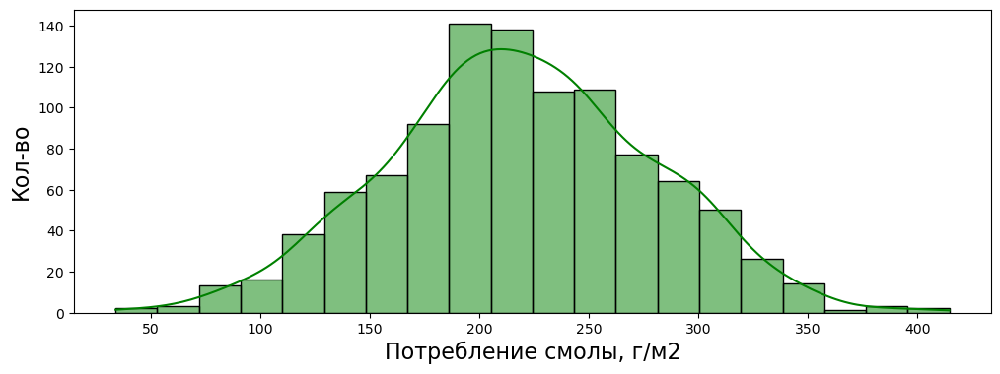

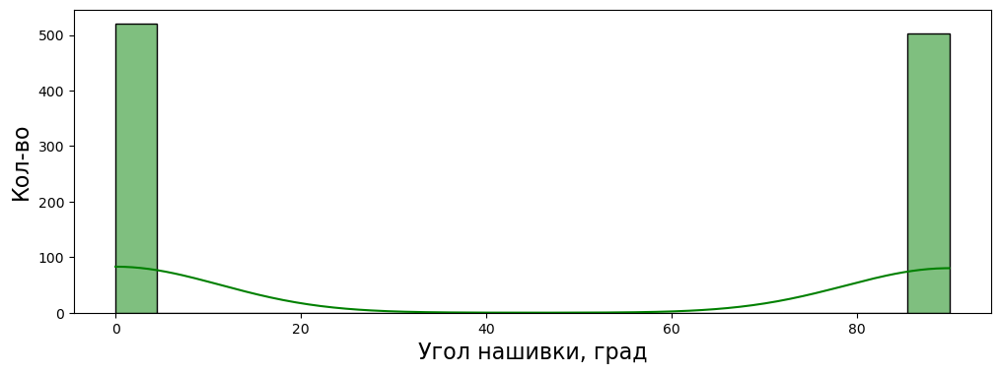

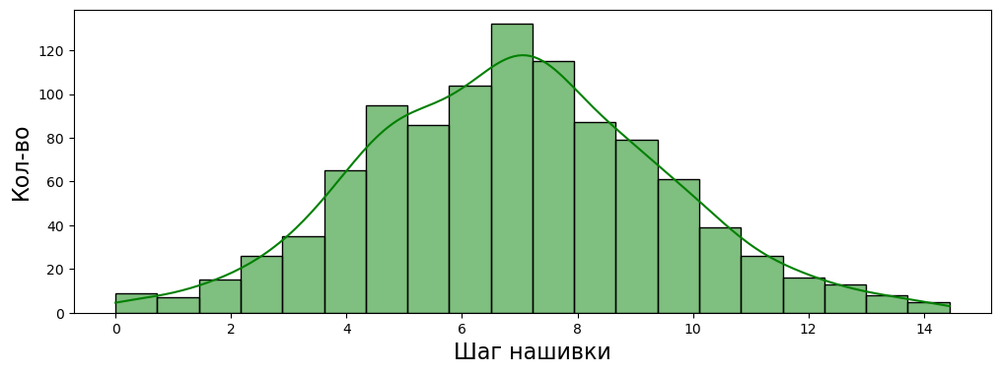

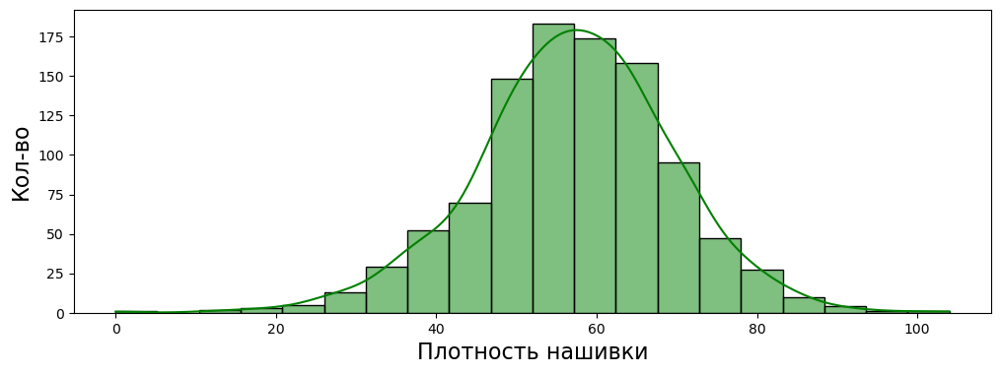

In [15]:
for col_name in df:

    
    plt.figure(figsize=(12, 4))
    sns.histplot(x=col_name, kde=True, bins=20, color = 'green',data=df)
    
    plt.xlabel(col_name, fontsize=16)
    plt.ylabel("Кол-во", fontsize=16)
    plt.show()

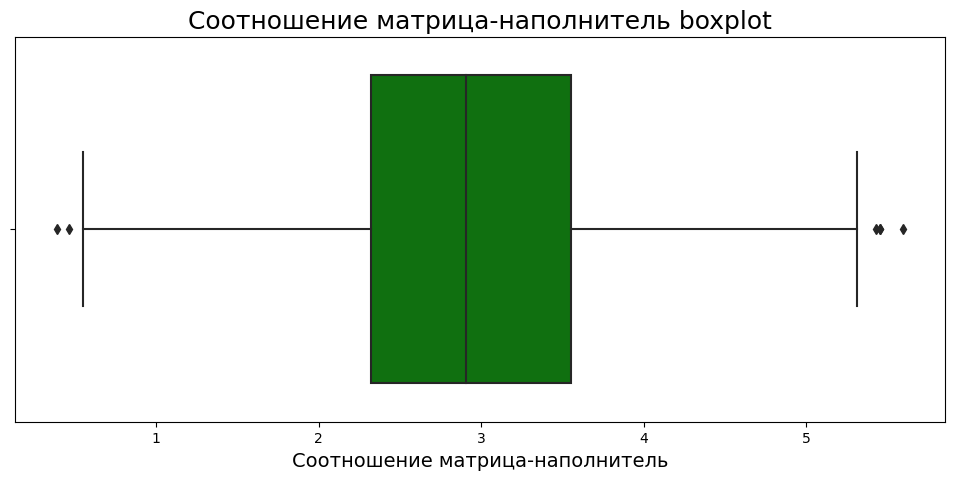

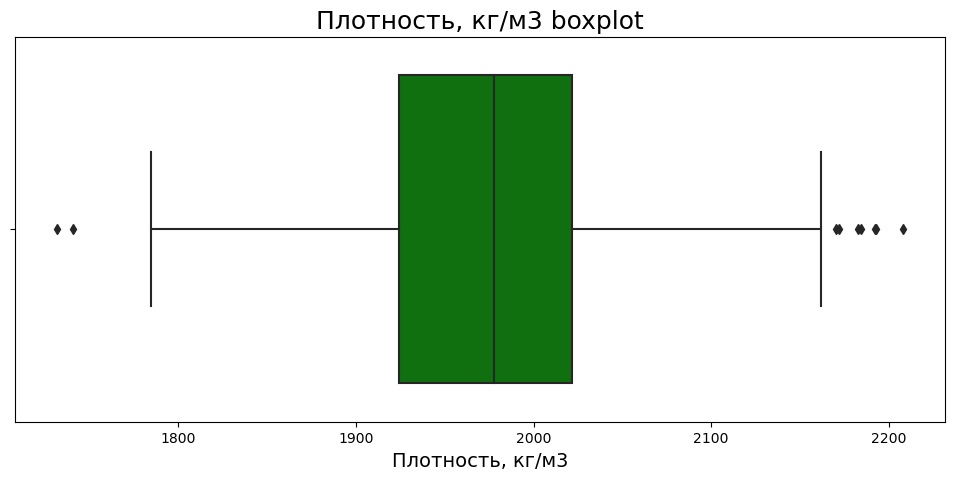

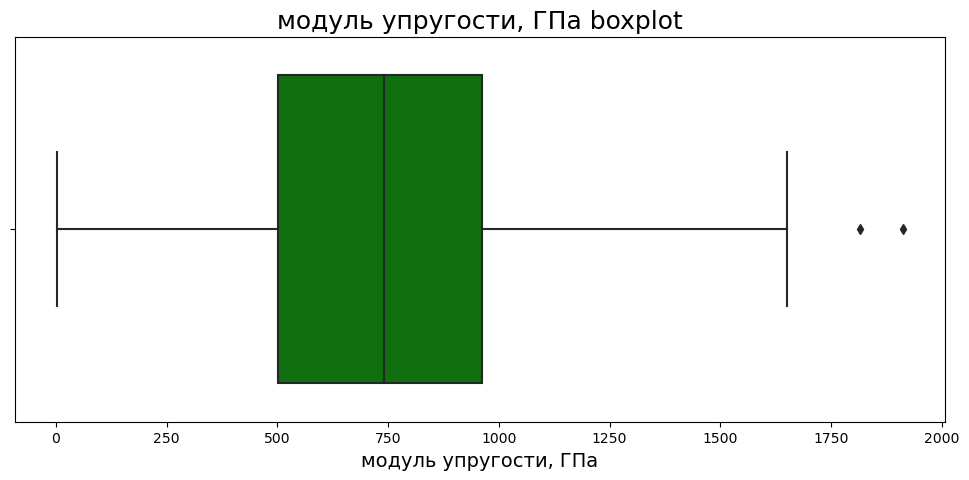

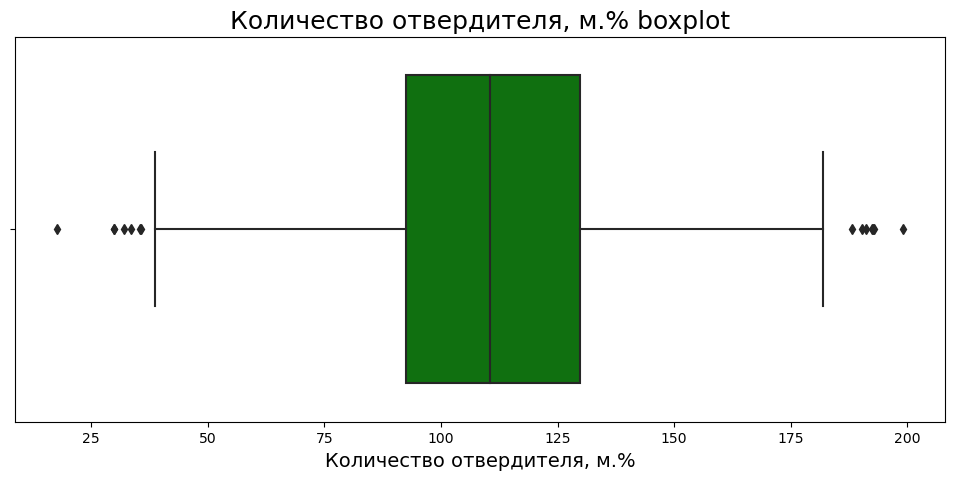

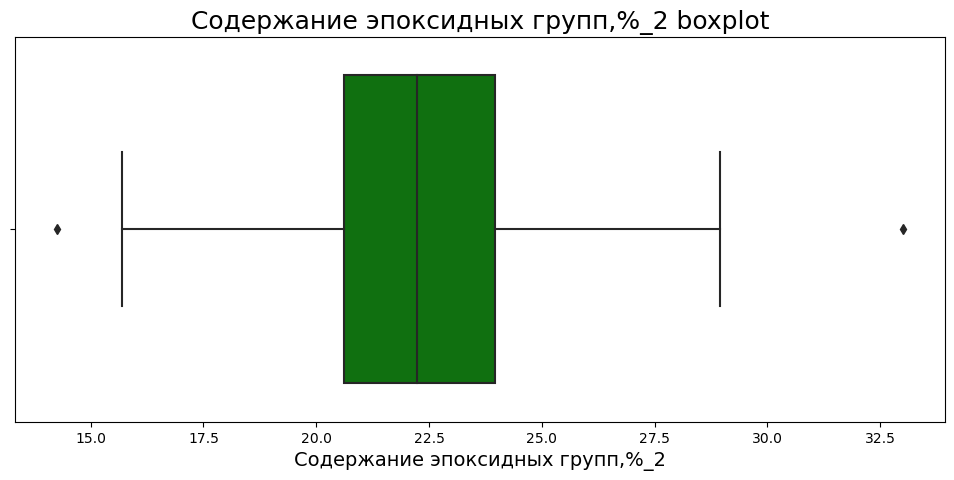

...

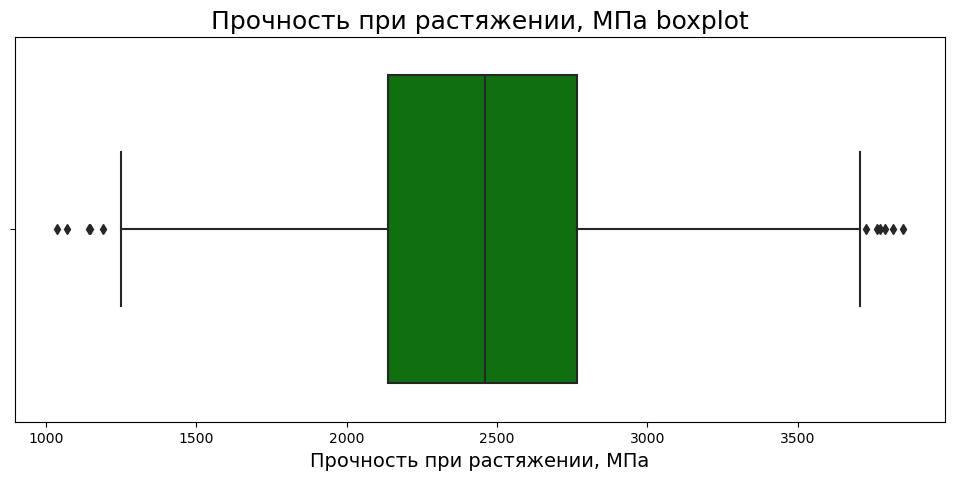

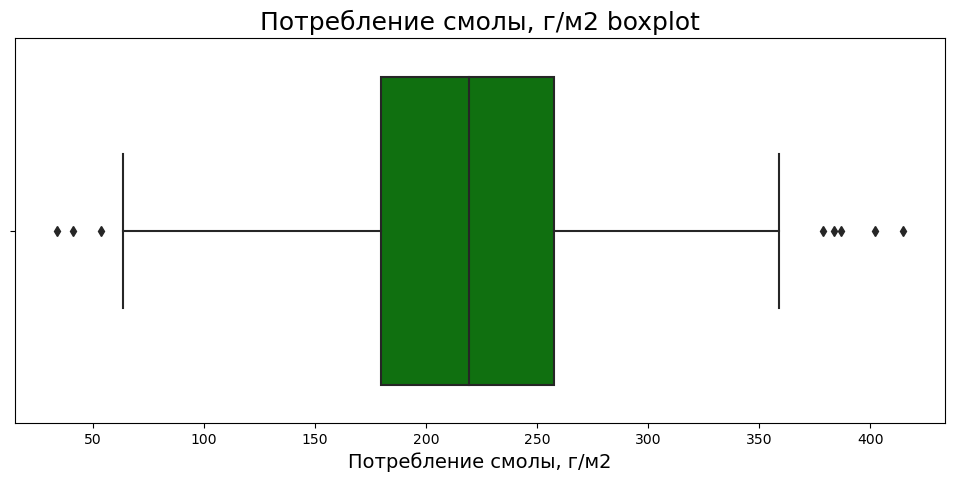

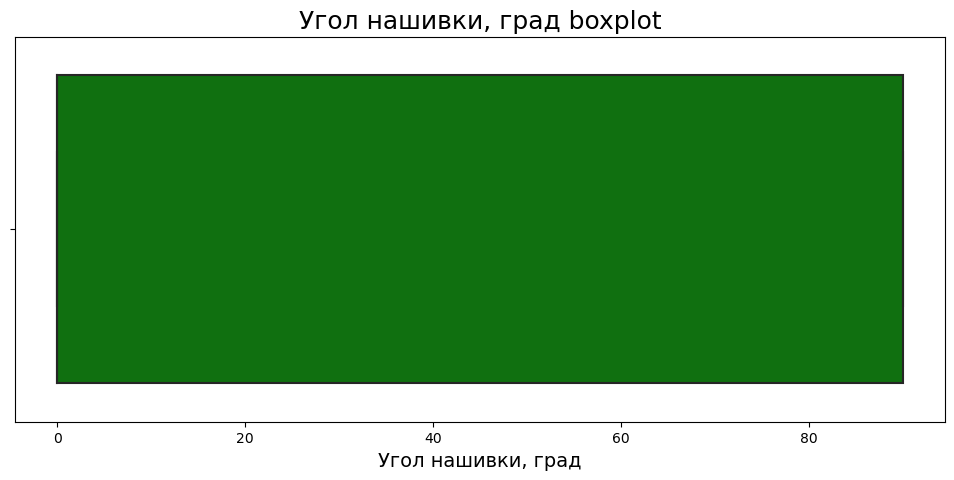

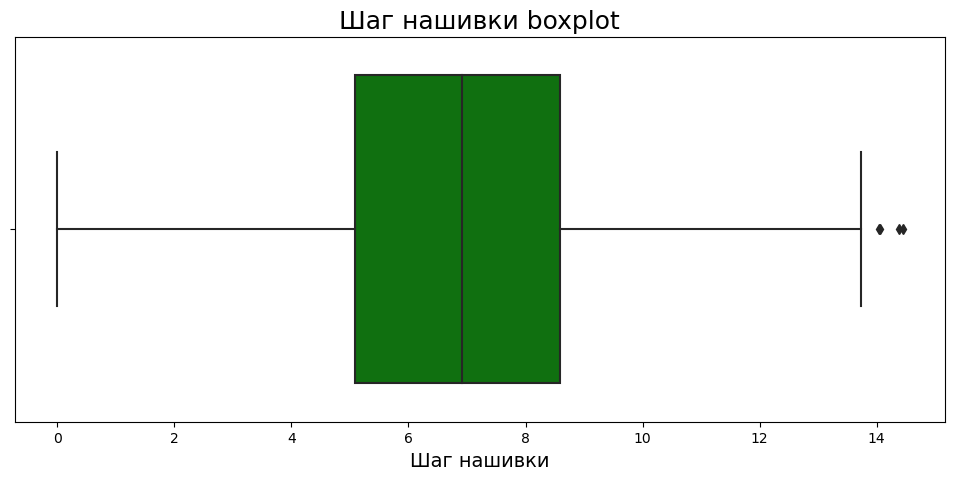

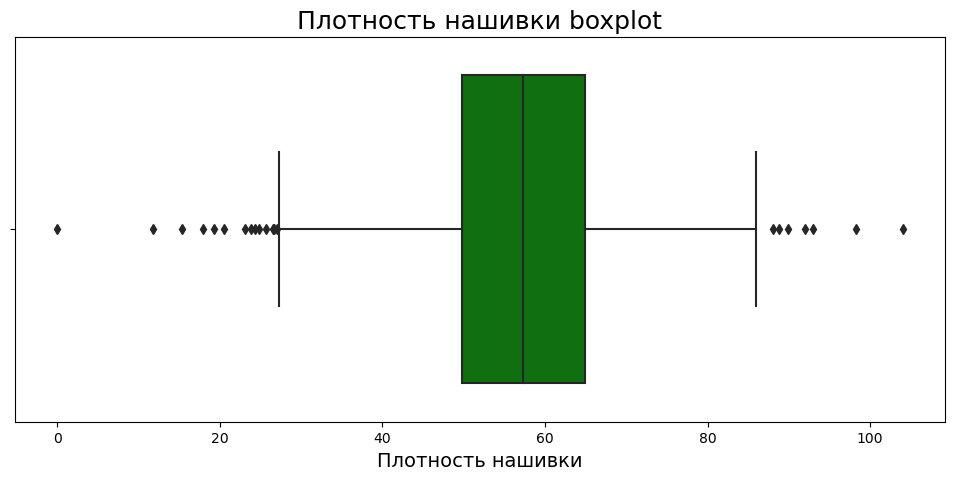

In [16]:
for col_name in df:
    plt.figure(figsize=(12, 5))
    sns.boxplot(x=df[col_name],color = 'green')
    plt.title(col_name + " boxplot", fontsize=18)
    plt.xlabel(col_name, fontsize=14)
    plt.show()

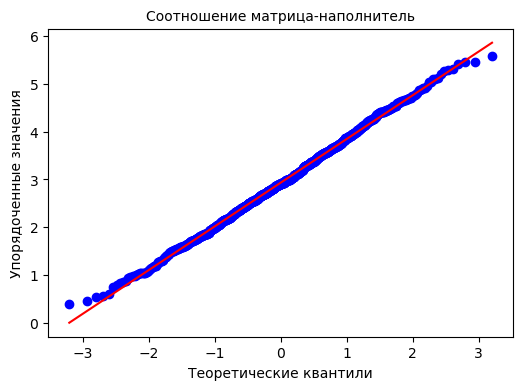

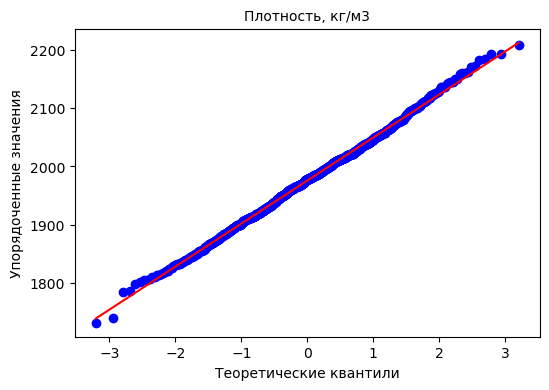

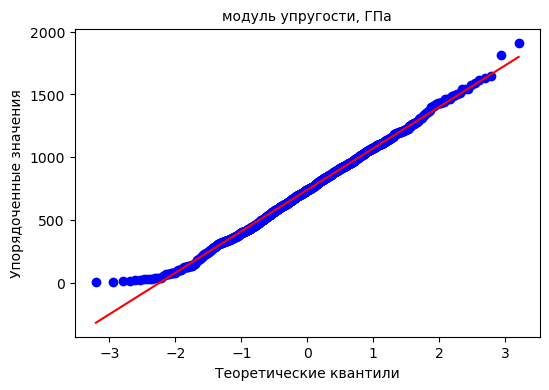

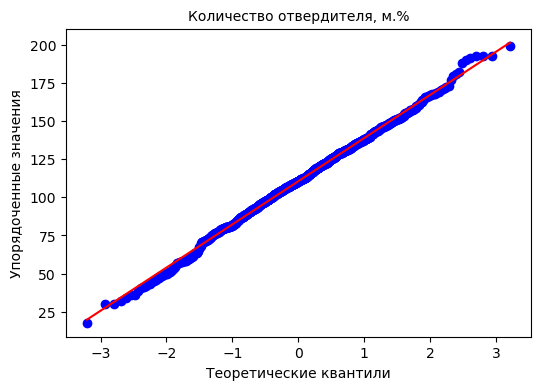

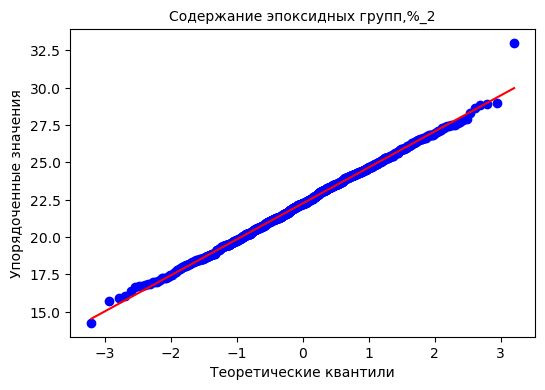

...

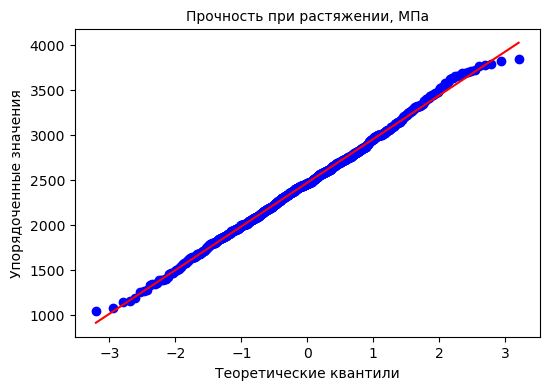

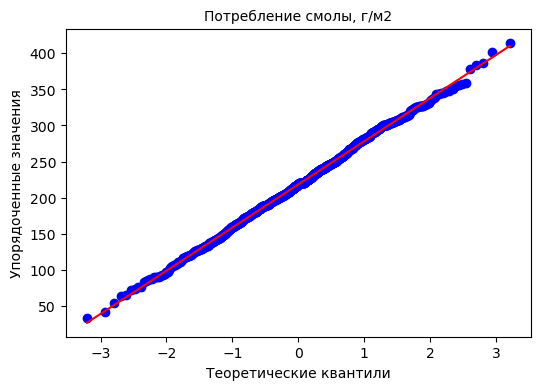

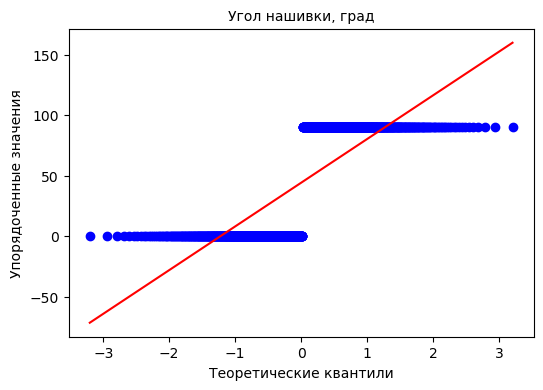

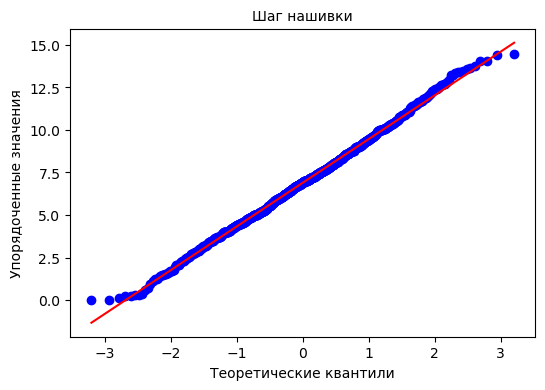

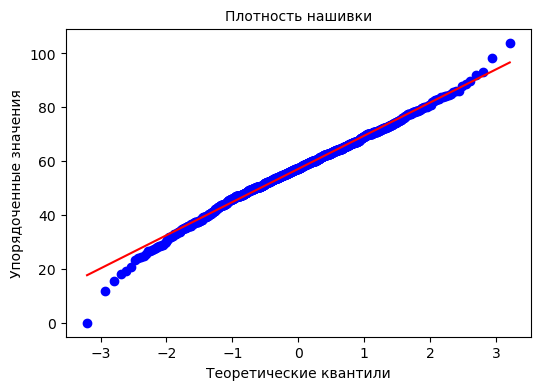

In [17]:
for i in df.columns:
    plt.figure(figsize=(6, 4))
    res = stats.probplot(df[i], plot=plt)
    plt.title(i, fontsize=10)
    plt.xlabel("Теоретические квантили", fontsize=10)
    plt.ylabel("Упорядоченные значения", fontsize=10)
    plt.show()

#### Кроме "Угол нашивки, град" и "Поверхностная плотность, г/м2" остальные переменные относительно хорошо соответствуют нормальному распределению

#### Проверим сколько уникальных значений в каждой колонке

In [19]:
df.nunique()

Соотношение матрица-наполнитель         1002
Плотность, кг/м3                        1002
модуль упругости, ГПа                   1002
Количество отвердителя, м.%             1002
Содержание эпоксидных групп,%_2         1002
Температура вспышки, С_2                1002
Поверхностная плотность, г/м2           1002
Модуль упругости при растяжении, ГПа    1002
Прочность при растяжении, МПа           1002
Потребление смолы, г/м2                 1002
Угол нашивки, град                         2
Шаг нашивки                              988
Плотность нашивки                        987
dtype: int64

In [18]:
col=['Соотношение матрица-наполнитель','Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%','Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2']
for i in col:
    df=df.drop_duplicates(subset =i)# оставим только уникальные значения в датафрейме до колонки  'Потребление смолы, г/м2'

In [234]:
df.nunique()

Соотношение матрица-наполнитель         1002
Плотность, кг/м3                        1002
модуль упругости, ГПа                   1002
Количество отвердителя, м.%             1002
Содержание эпоксидных групп,%_2         1002
Температура вспышки, С_2                1002
Поверхностная плотность, г/м2           1002
Модуль упругости при растяжении, ГПа    1002
Прочность при растяжении, МПа           1002
Потребление смолы, г/м2                 1002
Угол нашивки, град                         2
Шаг нашивки                              988
Плотность нашивки                        987
dtype: int64

### Удаление выбросов на основе межквартильного расстояния

In [20]:
col=['Соотношение матрица-наполнитель','Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%','Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']
for j in col:                                                                                #Выберем колонки которые содержат выбросы
    for i in [j]:
        q_1 = df[j].quantile(0.25)
        q_3 = df[j].quantile(0.75)
        IQR = q_3 - q_1
        min=q_1 - (IQR * 1.5)
        max=q_3 + (IQR * 1.5)
        df.loc[df[i] < min,i] = np.nan
        df.loc[df[i] > max,i] = np.nan# заменим на нулевые значения

In [236]:
df = df.dropna(axis = 0)# удаляем строки с нулевыми значениями

#### Смотрим, что получилось

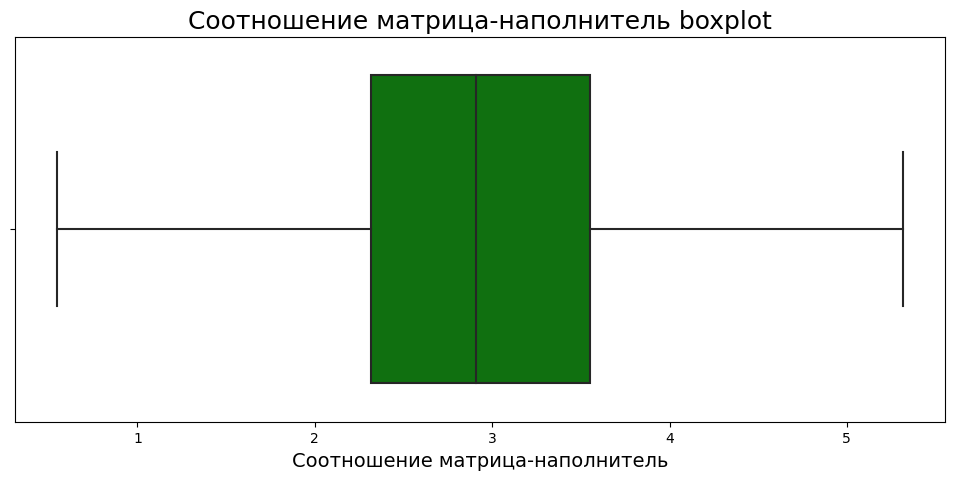

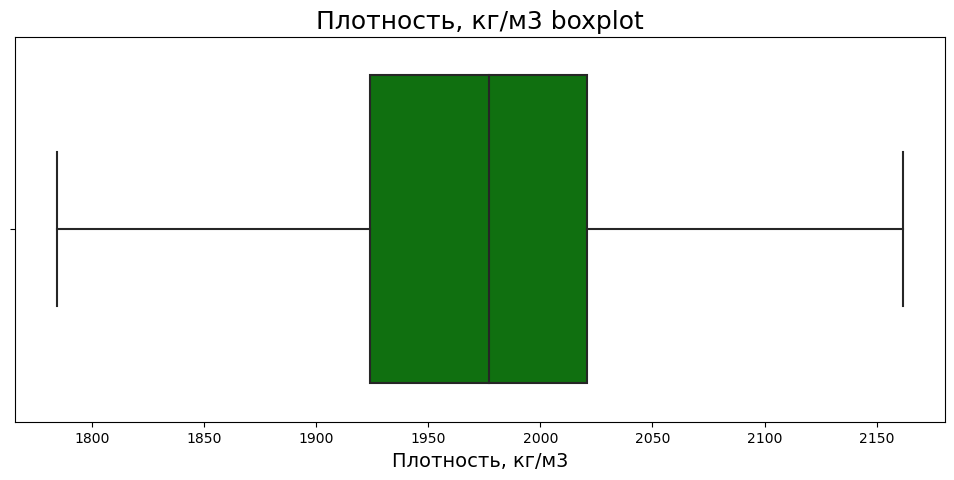

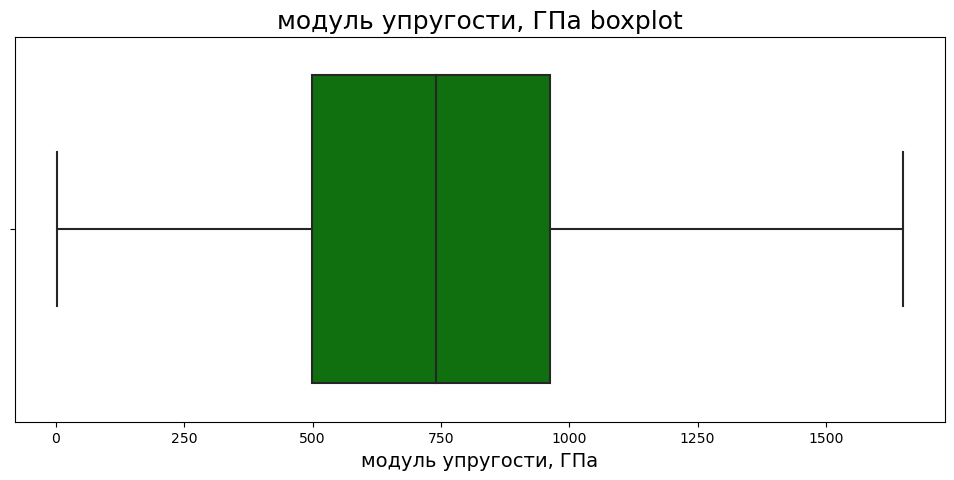

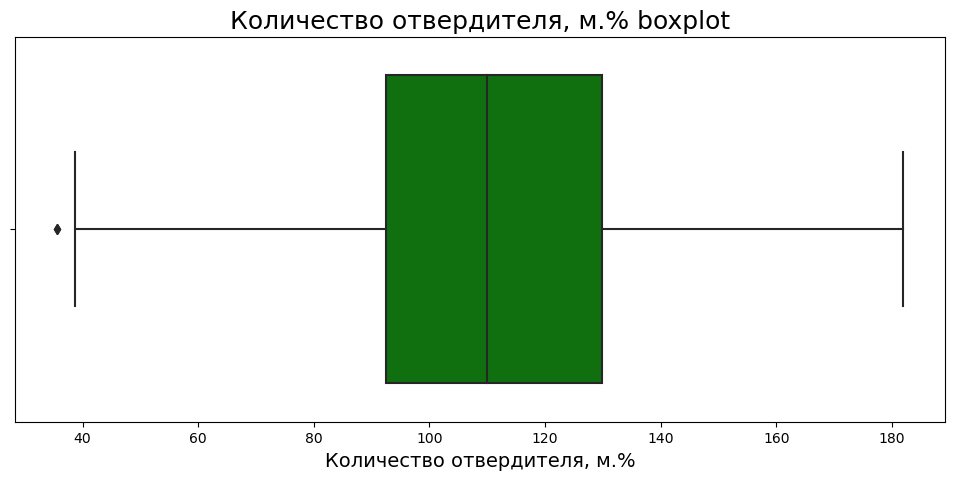

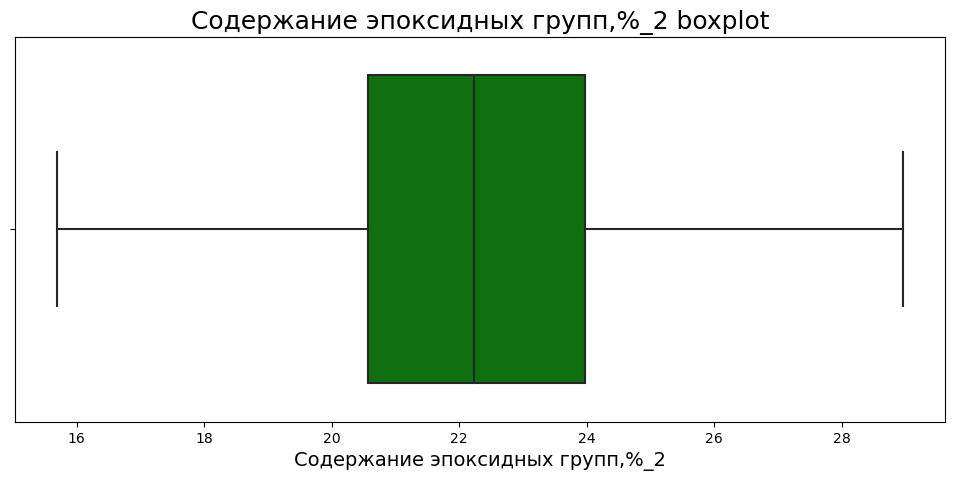

...

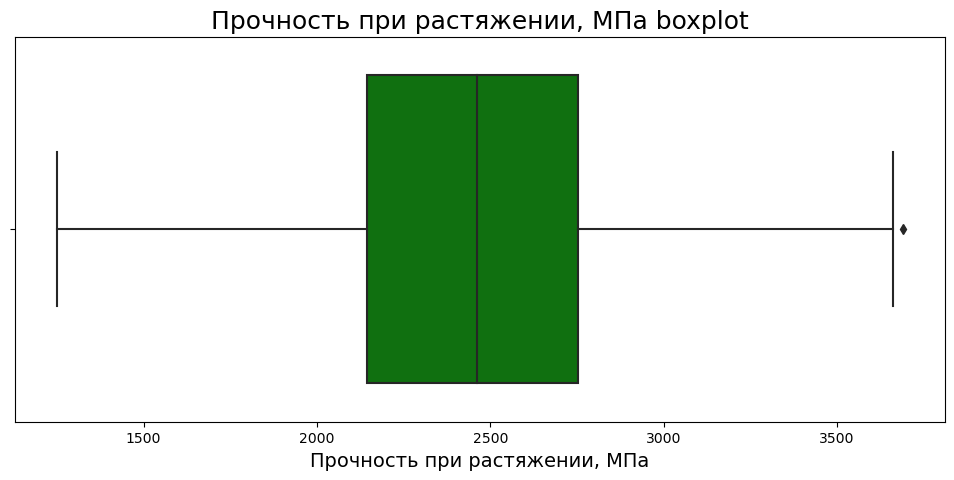

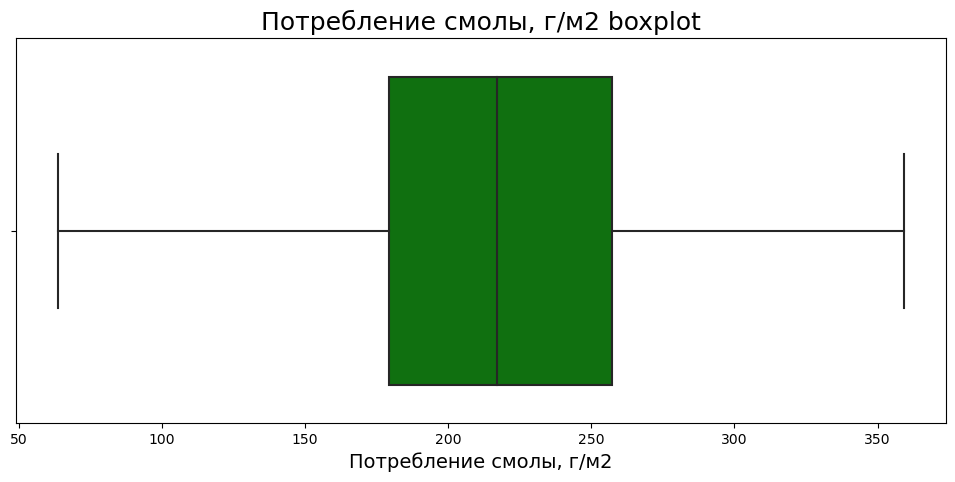

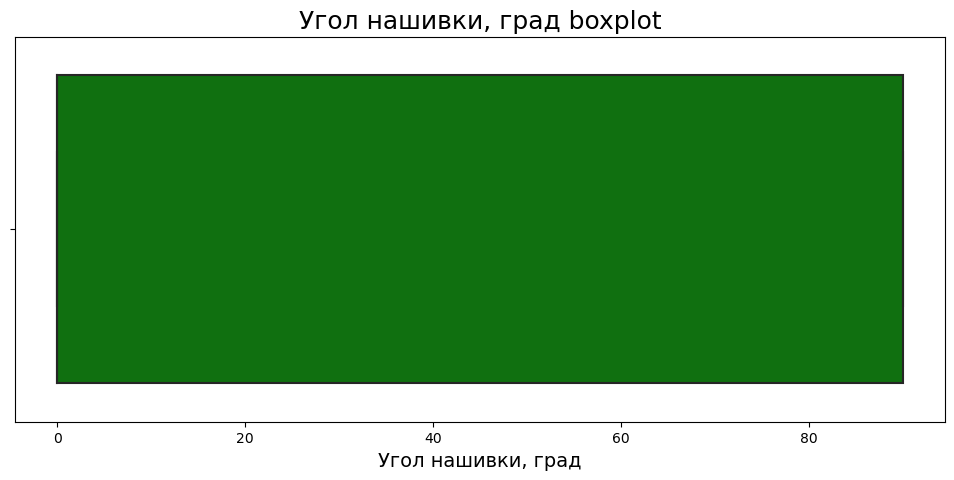

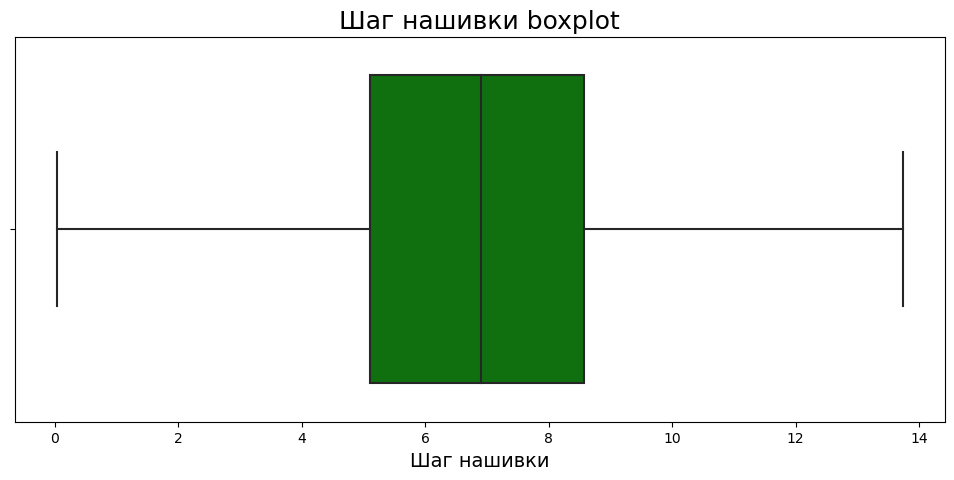

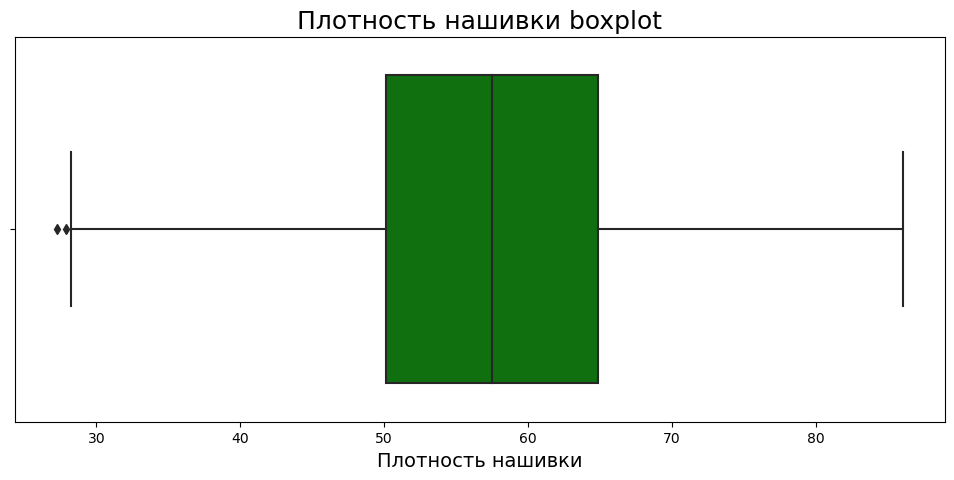

<Figure size 2500x1500 with 0 Axes>

<Figure size 2500x1500 with 0 Axes>

In [21]:
for col_name in df:
    plt.figure(figsize=(12, 5))
    sns.boxplot(x=df[col_name],color = 'green')
    plt.title(col_name + " boxplot", fontsize=18)
    plt.xlabel(col_name, fontsize=14)
    plt.show()
plt.figure(figsize=(25, 15))


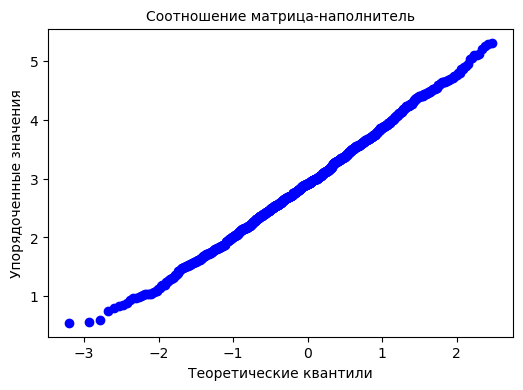

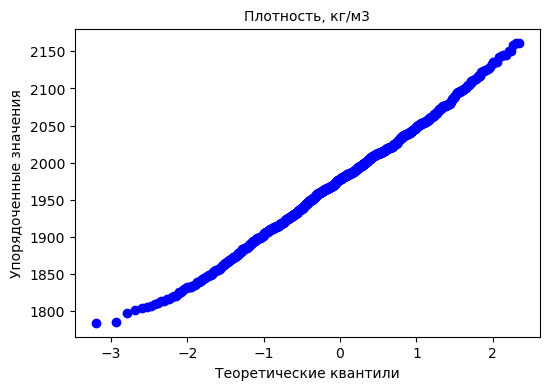

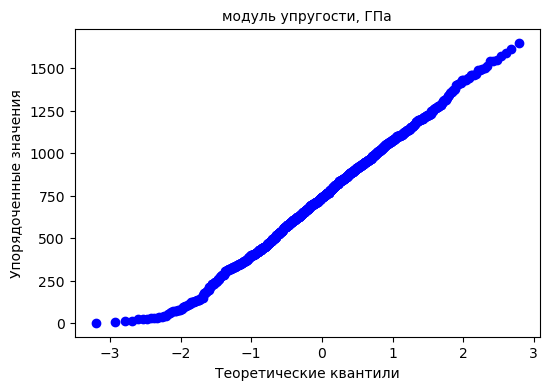

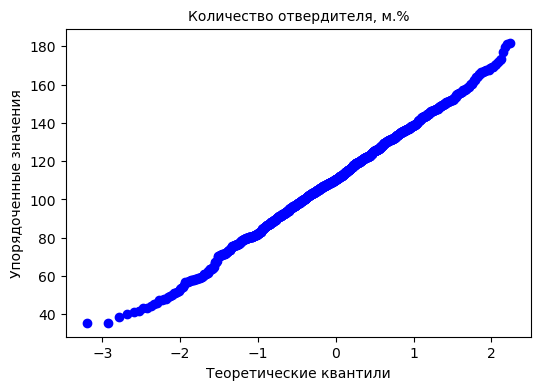

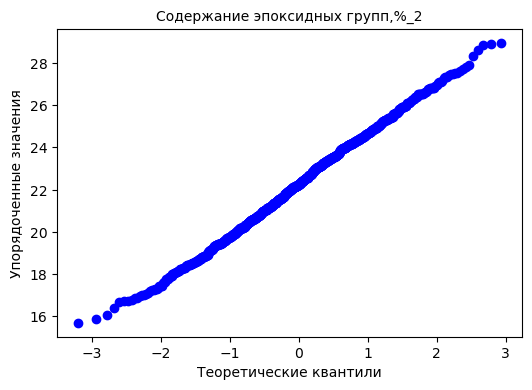

...

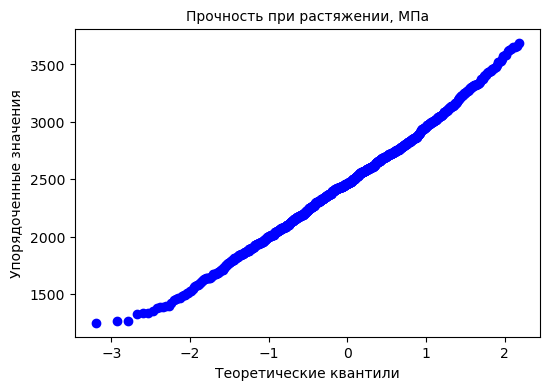

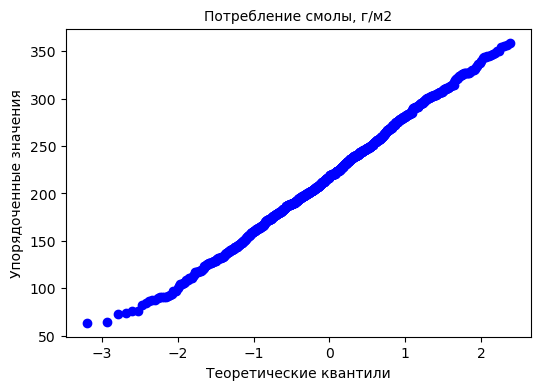

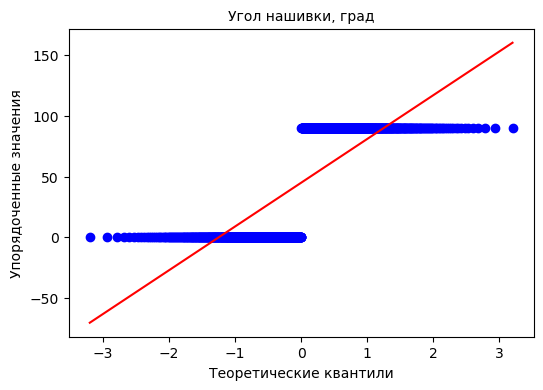

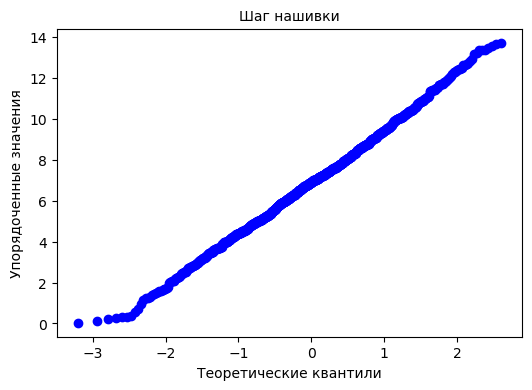

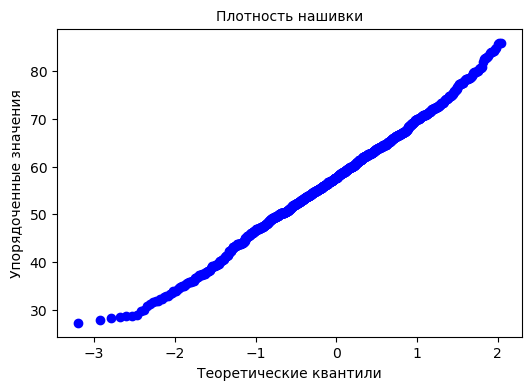

In [23]:
for i in df.columns:
    plt.figure(figsize=(6, 4))
    res = stats.probplot(df[i], plot=plt)
    plt.title(i, fontsize=10)
    plt.xlabel("Теоретические квантили", fontsize=10)
    plt.ylabel("Упорядоченные значения", fontsize=10)
    plt.show()

##### QQ-график подтверждает наши предыдущие выводы: кроме Stripe_angle все переменные относительно хорошо соответствуют нормальному распределению

## Корреляционная тепловая карта Пирсона

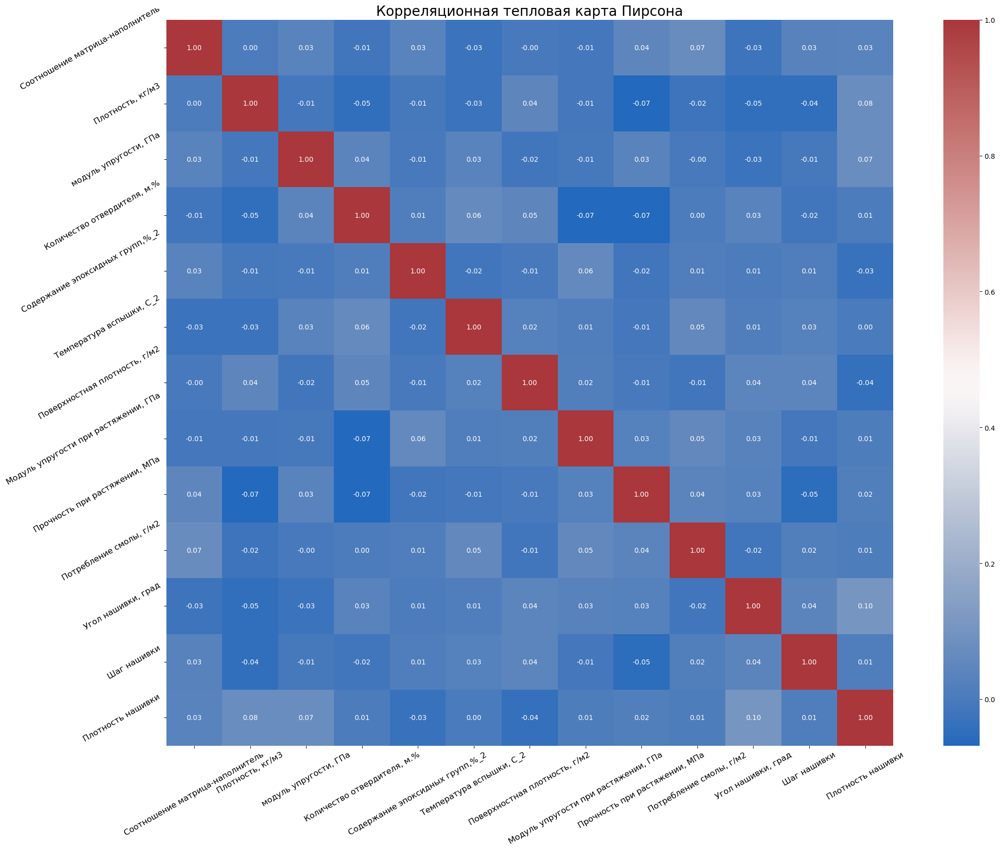

In [24]:
correlations = df.corr()
plt.figure(figsize=(26, 19))
ax = sns.heatmap(correlations, square=True, annot=True,
                 fmt='.2f', linecolor='white', cmap="vlag")
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30, fontsize=12)
plt.title("Корреляционная тепловая карта Пирсона", fontsize=20)
plt.show()

In [25]:
df.skew()#ассиметрия по всем колонкам

Соотношение матрица-наполнитель         0.052410
Плотность, кг/м3                       -0.010555
модуль упругости, ГПа                   0.042789
Количество отвердителя, м.%            -0.107328
Содержание эпоксидных групп,%_2        -0.004896
Температура вспышки, С_2                0.018208
Поверхностная плотность, г/м2           0.342509
Модуль упругости при растяжении, ГПа    0.100434
Прочность при растяжении, МПа           0.054598
Потребление смолы, г/м2                -0.023096
Угол нашивки, град                      0.003998
Шаг нашивки                             0.056794
Плотность нашивки                      -0.080099
dtype: float64

In [26]:
df.kurt()# эксцесс по всем колонкам

Соотношение матрица-наполнитель        -0.323073
Плотность, кг/м3                       -0.240276
модуль упругости, ГПа                  -0.385525
Количество отвердителя, м.%            -0.225742
Содержание эпоксидных групп,%_2        -0.354758
Температура вспышки, С_2               -0.367558
Поверхностная плотность, г/м2          -0.548606
Модуль упругости при растяжении, ГПа   -0.299448
Прочность при растяжении, МПа          -0.187296
Потребление смолы, г/м2                -0.401621
Угол нашивки, град                     -2.003988
Шаг нашивки                            -0.094318
Плотность нашивки                      -0.191330
dtype: float64

#### Попарные графики рассеяния точек

<Figure size 1600x1600 with 0 Axes>

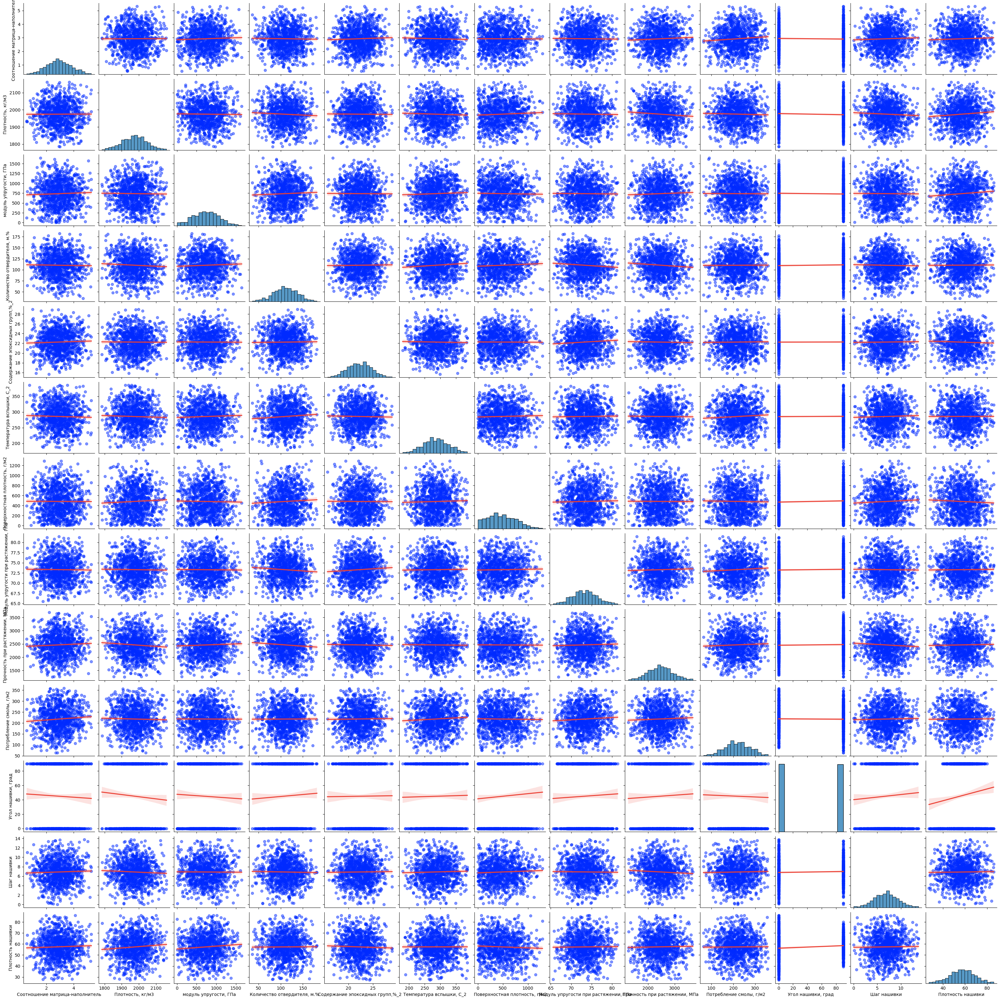

In [27]:
df_top_corr = df[['Соотношение матрица-наполнитель','Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%','Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Угол нашивки, град','Шаг нашивки','Плотность нашивки']]
plt.figure(figsize=(16, 16))
sns.pairplot(df_top_corr, kind='reg', diag_kind='hist', plot_kws={'line_kws': {'color': '#eb4034'},
                                                                  'scatter_kws': {'alpha': 0.5,
                                                                                  'color': '#002aff'}})
plt.show()

In [243]:
#### Корреляции нет

### Основная статистическая информация

In [244]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000
mean,2.927166,1974.126318,738.629013,110.646640,22.215999,285.740600,483.268410,73.305987,2464.669593,217.587886,46.572052,6.912486,57.419622
std,0.896200,70.805900,328.930111,27.285447,2.419511,39.818633,279.294096,3.039358,459.111175,57.807551,44.997101,2.517394,11.286994
min,0.547391,1784.482245,2.436909,35.599697,15.695894,179.374391,0.603740,65.553336,1250.392802,63.685698,0.000000,0.037639,27.272928
25%,2.319283,1923.713503,498.438068,91.918258,20.540490,258.539199,268.717312,71.291137,2150.615297,179.041257,0.000000,5.155437,50.217314
50%,2.906270,1977.321002,738.275026,110.438871,22.184713,285.853960,457.732246,73.247594,2461.020408,216.691628,90.000000,6.938000,57.546947
75%,3.548025,2020.158764,962.851423,130.457966,23.982115,313.186864,695.900862,75.314494,2751.815744,256.749159,90.000000,8.585130,64.798211
max,5.314144,2161.565216,1649.415706,181.828448,28.955094,386.067992,1291.340115,81.417126,3689.223681,359.052220,90.000000,13.732404,86.012427


## Разработка признаков и трансформация существующих

#### Общий вес переменных. Суммарный вес всех компонентов в каждом материале отличается, и эта разница может повлиять на выходные переменные, поэтому был создан новый столбец "Тотал" 

In [28]:
df["Тотал"] = df.apply(lambda x: sum([x["Соотношение матрица-наполнитель"], x["Плотность, кг/м3"], x["модуль упругости, ГПа"],
                              x["Количество отвердителя, м.%"], x["Содержание эпоксидных групп,%_2"], x["Температура вспышки, С_2"], x["Поверхностная плотность, г/м2"], x["Модуль упругости при растяжении, ГПа"], x["Прочность при растяжении, МПа"], x["Потребление смолы, г/м2"], x["Угол нашивки, град"], x["Шаг нашивки"], x["Плотность нашивки"]]), axis=1)

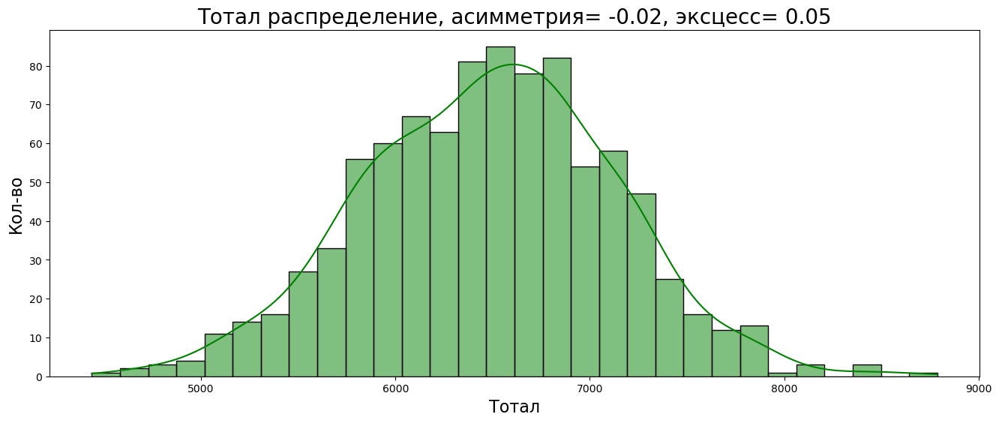

In [29]:
skewness = round(df['Тотал'].skew(), 2)
kurtosis = round(df['Тотал'].kurt(), 2)

plt.figure(figsize=(16, 6))
sns.histplot(x='Тотал',kde=True, bins=30,color = 'green', data=df)
plt.title("Тотал распределение, асимметрия= " + str(skewness) +
          ", эксцесс= " + str(kurtosis), fontsize=20)
plt.xlabel('Тотал', fontsize=16)
plt.ylabel("Кол-во", fontsize=16)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

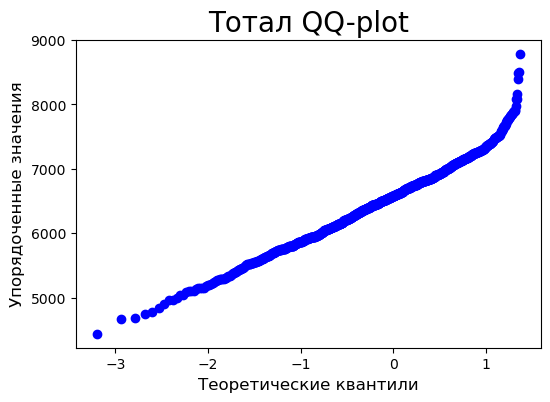

In [31]:
plt.figure(figsize=(6, 4))
res = stats.probplot(df['Тотал'], plot=plt)
plt.title("Тотал QQ-plot", fontsize=20)
plt.xlabel("Теоретические квантили", fontsize=12)
plt.ylabel("Упорядоченные значения", fontsize=12)
plt.show()

##### Поскольку совокупная плотность компонентов меняется, меняется и их отношение плотности каждого компонента к общей плотности. Поэтому я собираюсь трансформировать каждую переменную, которая содержит информацию о его плотности, выраженной в долях.

In [32]:
weight_vars = ['Соотношение матрица-наполнитель','Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%','Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Угол нашивки, град','Шаг нашивки','Плотность нашивки']
df_2 = df.copy()
for var in weight_vars:
    df_2[var + " %"] = df_2.apply(lambda x: (x[var]/x['Тотал'])*10000, axis=1)##масштаб увеличен в 10000 раз(трансформированные переменные умножены на одно и тоже чило)

#### Теперь после добавления новых переменных посмотрим на корреляционную тепловую карту

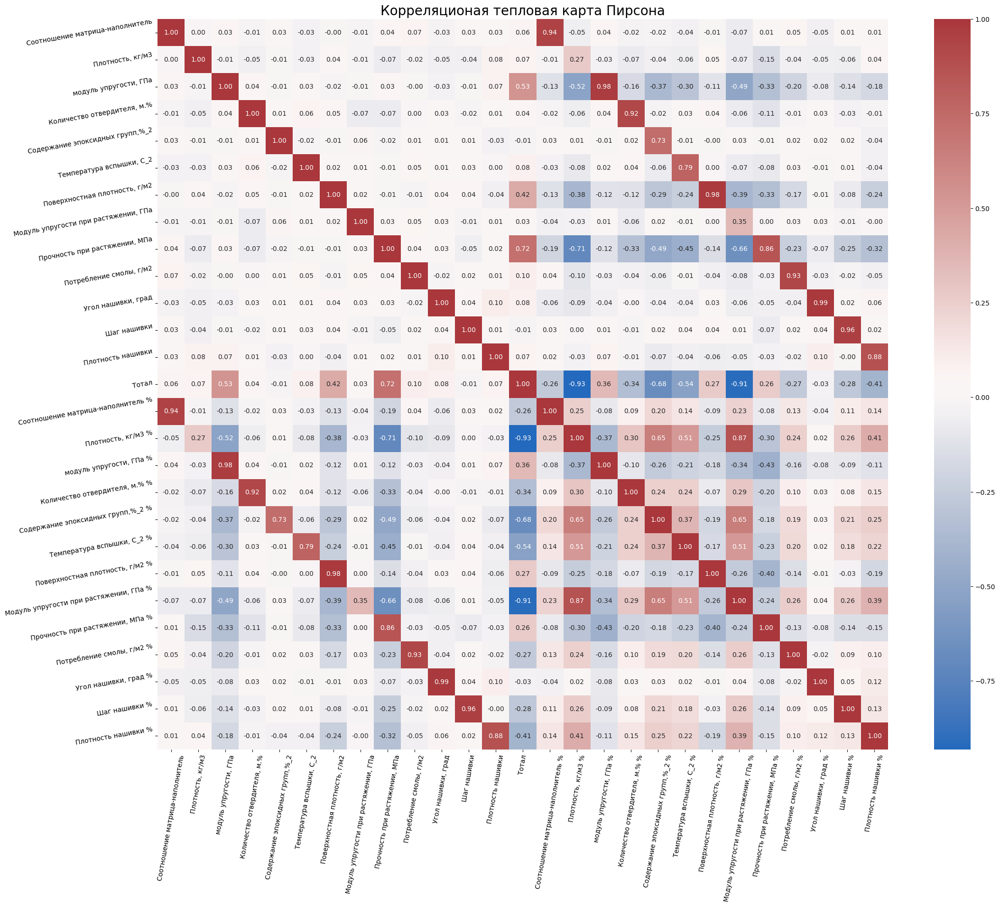

In [33]:
correlations = df_2.corr()
plt.figure(figsize=(25, 20))
ax = sns.heatmap(correlations, square=True, annot=True,
                 fmt='.2f', linecolor='white', cmap="vlag")
ax.set_xticklabels(ax.get_xticklabels(), rotation=80, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=10, fontsize=10)
plt.title("Корреляционая тепловая карта Пирсона", fontsize=20)
plt.show()

In [39]:
#Оставим новый трансформированный датафрейм
df_actual= df_2.drop(['Соотношение матрица-наполнитель','Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%','Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Угол нашивки, град','Шаг нашивки','Плотность нашивки'], axis=1)

#### Корреляционная карта и диаграмма рассеивания нового трансформированного датафрейма

<Figure size 1500x1500 with 0 Axes>

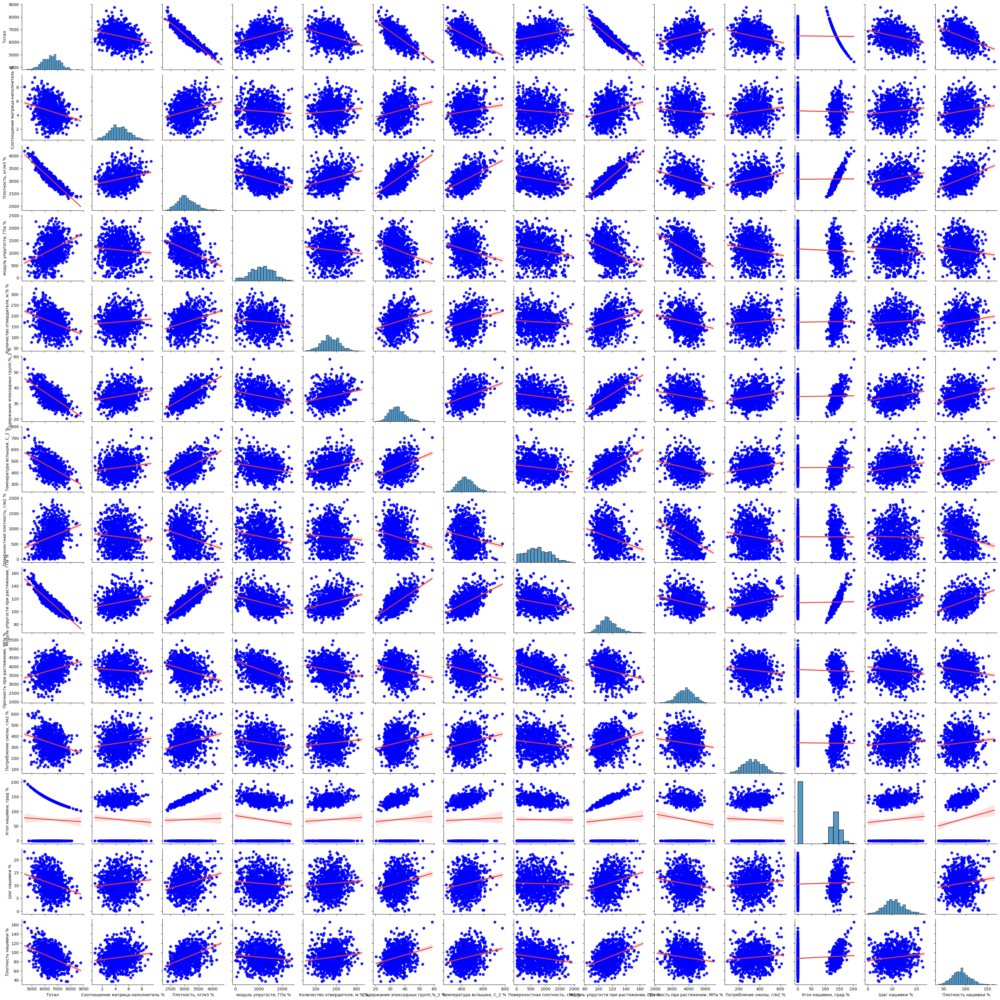

In [40]:
plt.figure(figsize=(15, 15))
sns.pairplot(df_actual, kind='reg', diag_kind='hist', plot_kws={'line_kws': {'color': '#eb4034'},
                                                                  'scatter_kws': {'alpha': 0.9,
                                                                                  'color': 'blue'}})
plt.show()        

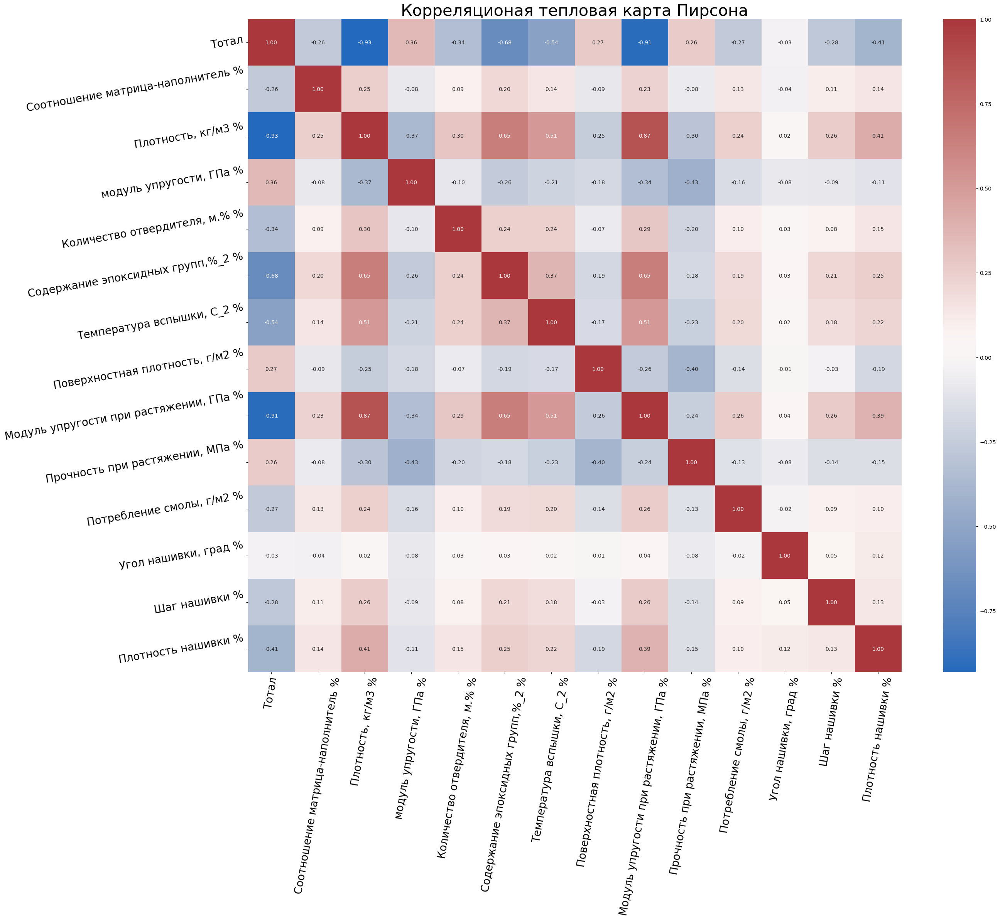

In [41]:
correlations = df_actual.corr()
plt.figure(figsize=(28, 22))
ax = sns.heatmap(correlations, square=True, annot=True,
                 fmt='.2f', linecolor='black', cmap="vlag")
ax.set_xticklabels(ax.get_xticklabels(), rotation=80, fontsize=20)
ax.set_yticklabels(ax.get_yticklabels(), rotation=10, fontsize=20)
plt.title("Корреляционая тепловая карта Пирсона", fontsize=30)
plt.show()

#### Проверим диаграмы размаха.

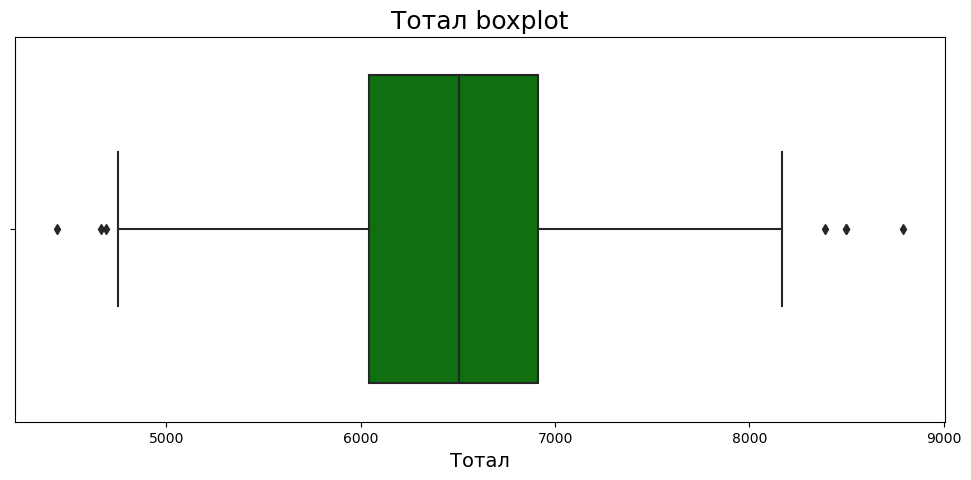

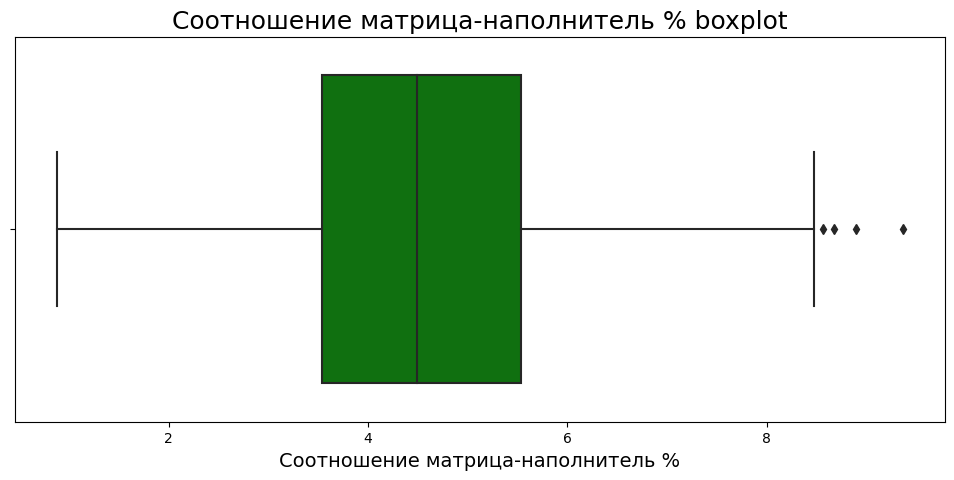

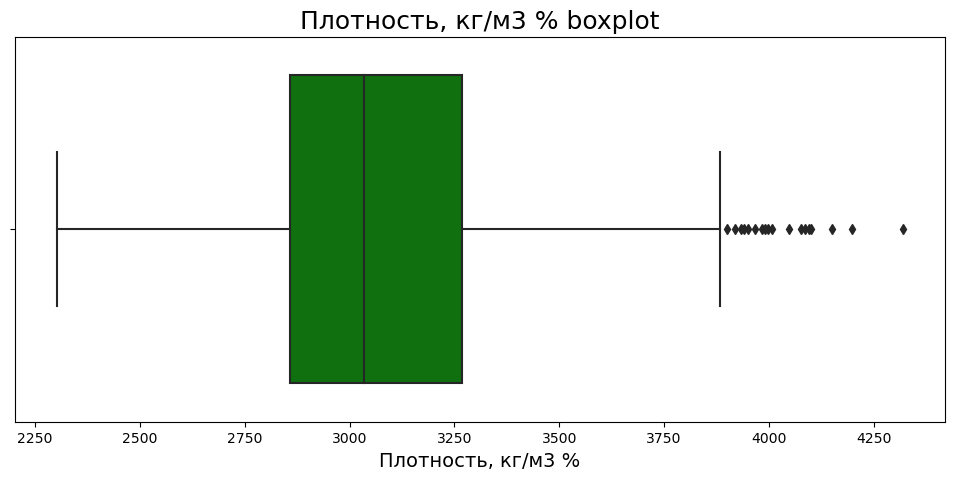

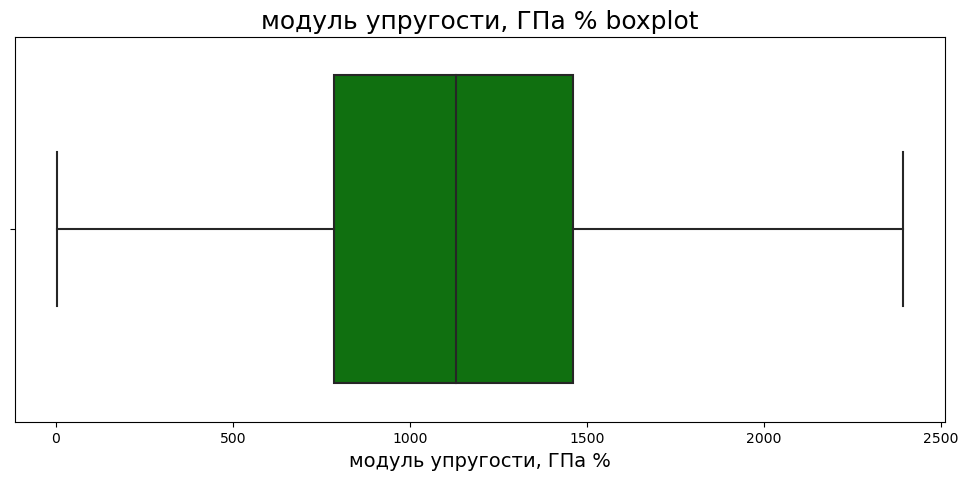

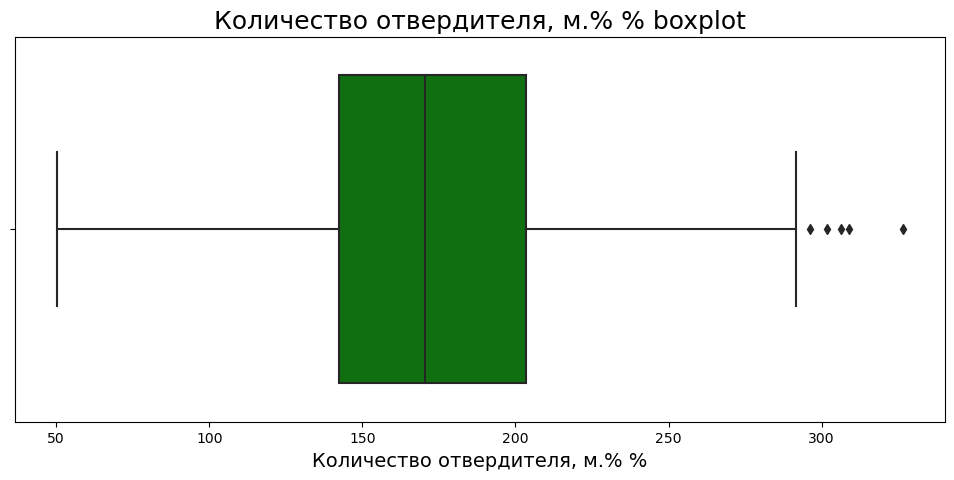

...

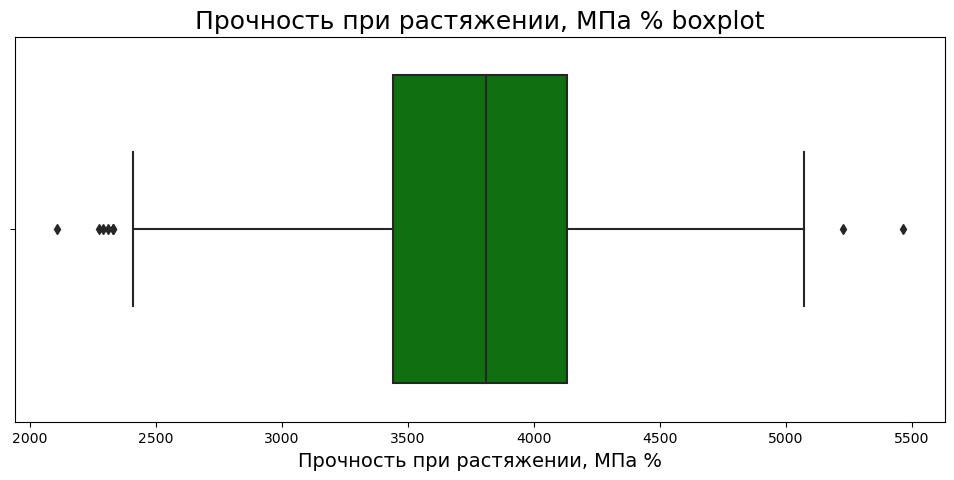

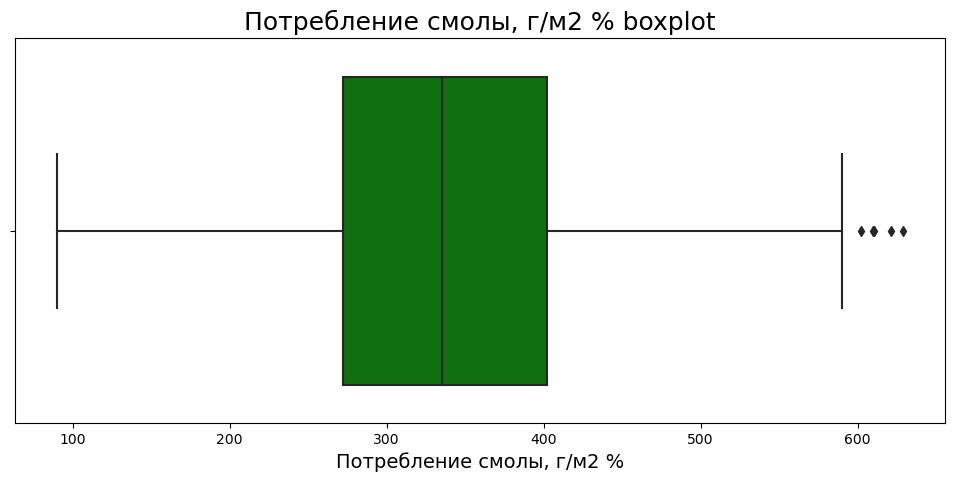

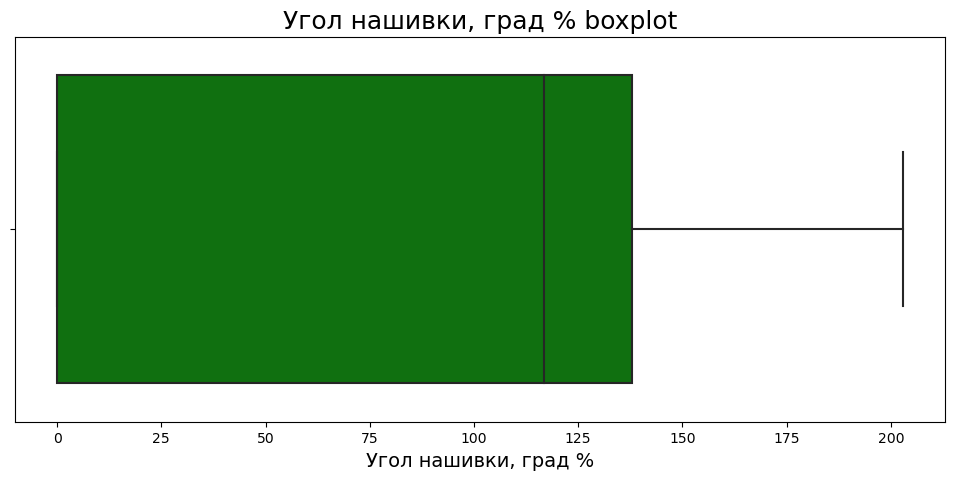

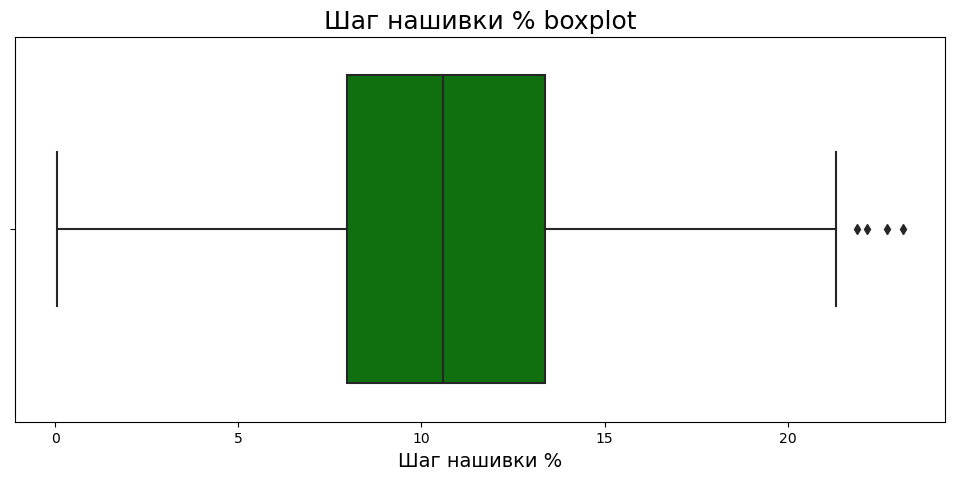

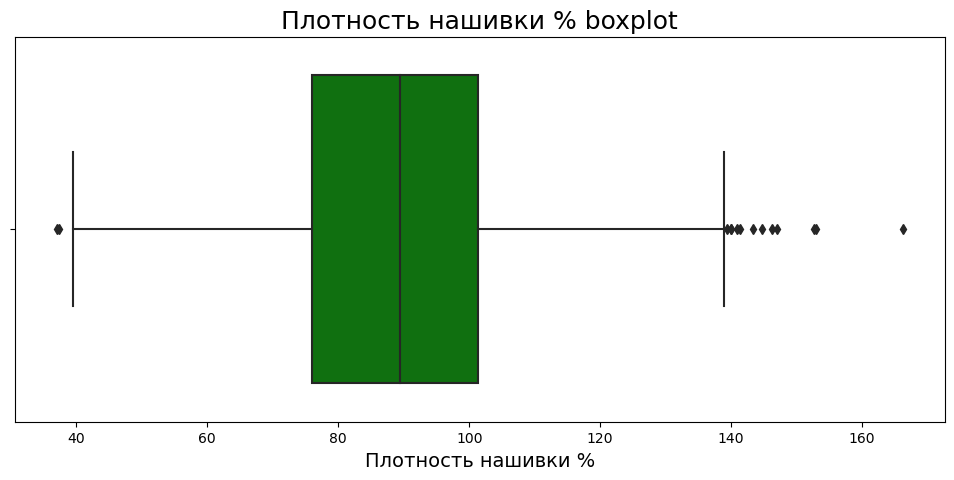

In [42]:
for col_name in df_actual:
    plt.figure(figsize=(12, 5))
    sns.boxplot(x=df_actual[col_name],color = 'green')
    plt.title(col_name + " boxplot", fontsize=18)
    plt.xlabel(col_name, fontsize=14)
    plt.show()

In [43]:
##### Удалим выбросы

In [44]:
col=['Тотал','Соотношение матрица-наполнитель %','Плотность, кг/м3 %', 'модуль упругости, ГПа %', 'Количество отвердителя, м.% %','Содержание эпоксидных групп,%_2 %', 'Температура вспышки, С_2 %','Поверхностная плотность, г/м2 %','Модуль упругости при растяжении, ГПа %','Прочность при растяжении, МПа %','Потребление смолы, г/м2 %','Шаг нашивки %','Плотность нашивки %']
for j in col:                                                                                #Выберем колонки которые содержат выбросы
    for i in [j]:
        q_1 = df_actual[j].quantile(0.25)
        q_3 = df_actual[j].quantile(0.75)
        IQR = q_3 - q_1
        min=q_1 - (IQR * 1.5)
        max=q_3 + (IQR * 1.5)
        df_actual.loc[df_actual[i] < min,i] = np.nan
        df_actual.loc[df_actual[i] > max,i] = np.nan# заменим на нулевые значения

In [45]:
df_actual = df_actual.dropna(axis = 0)# удаляем строки с нулевыми значениями

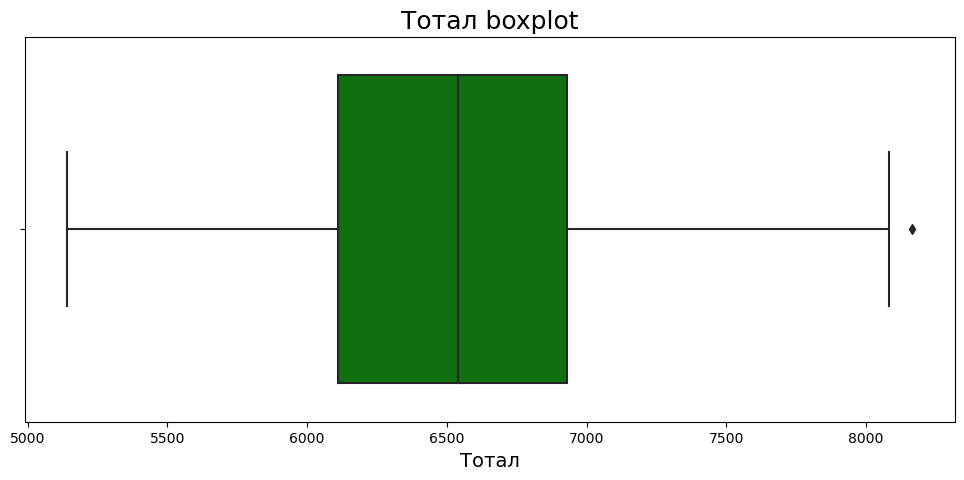

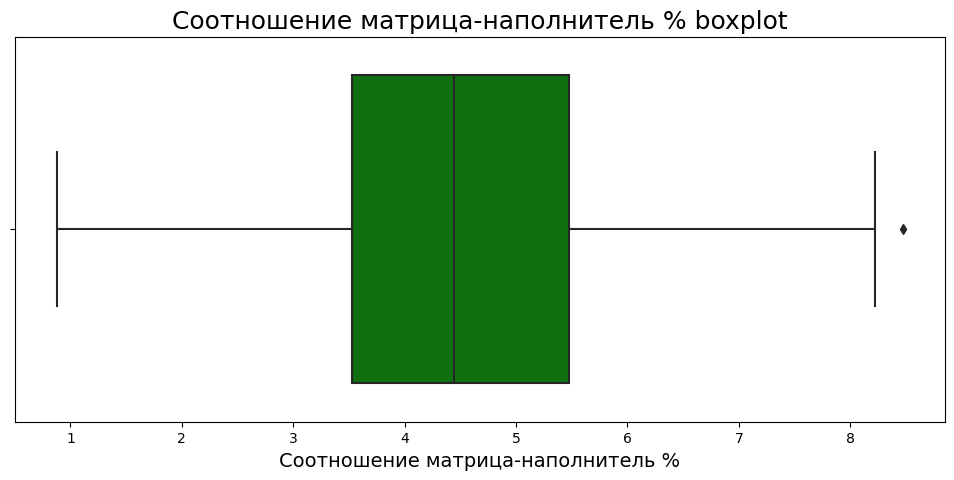

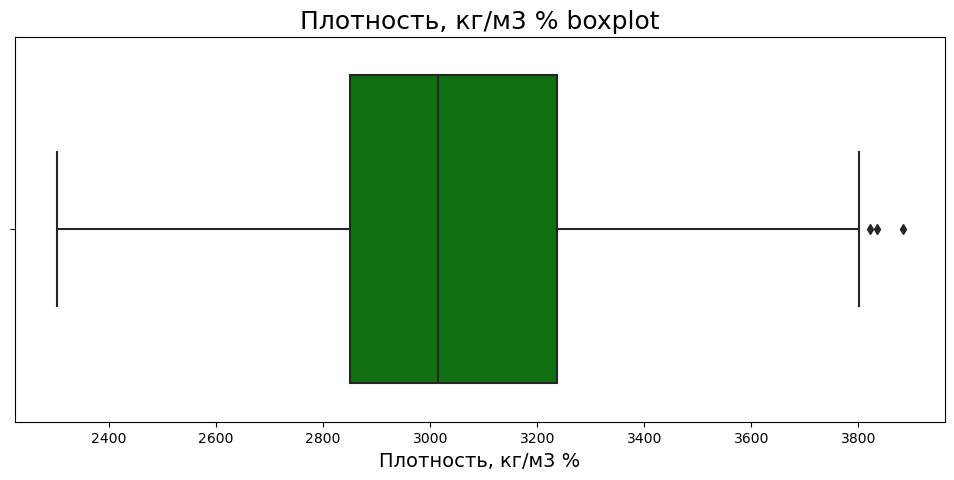

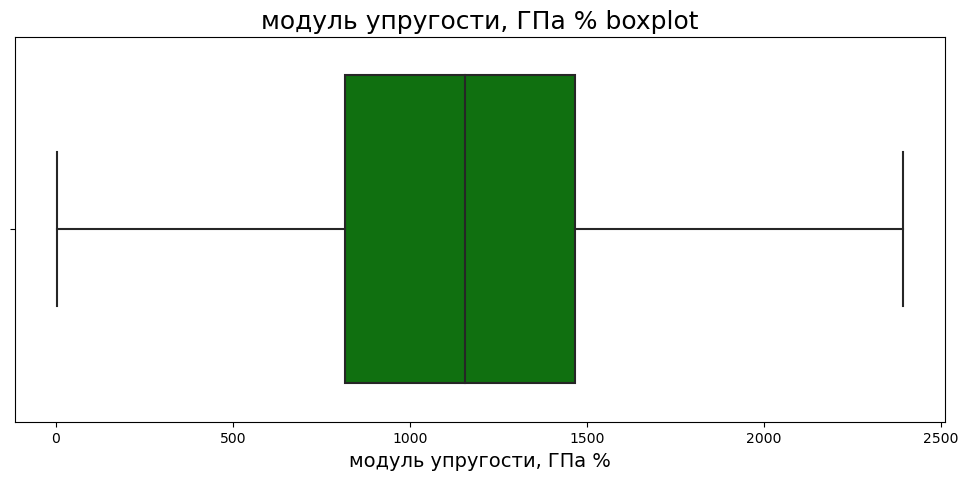

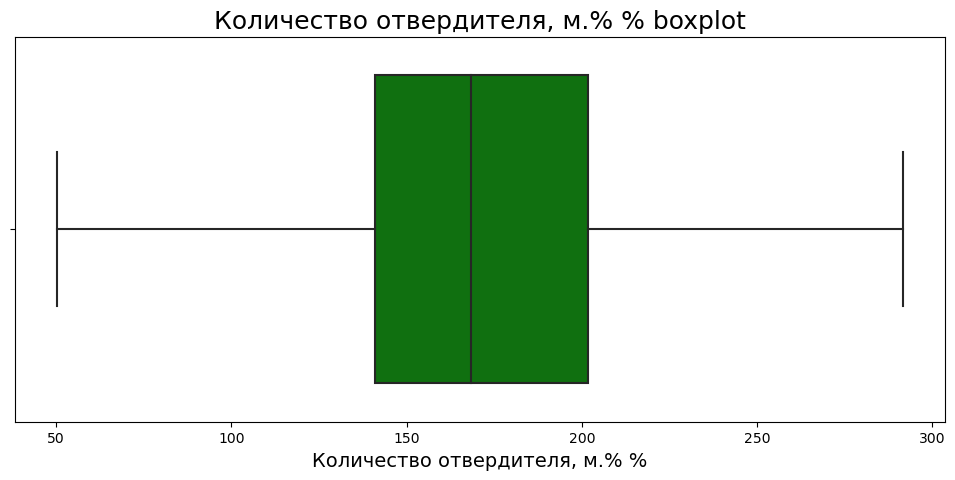

...

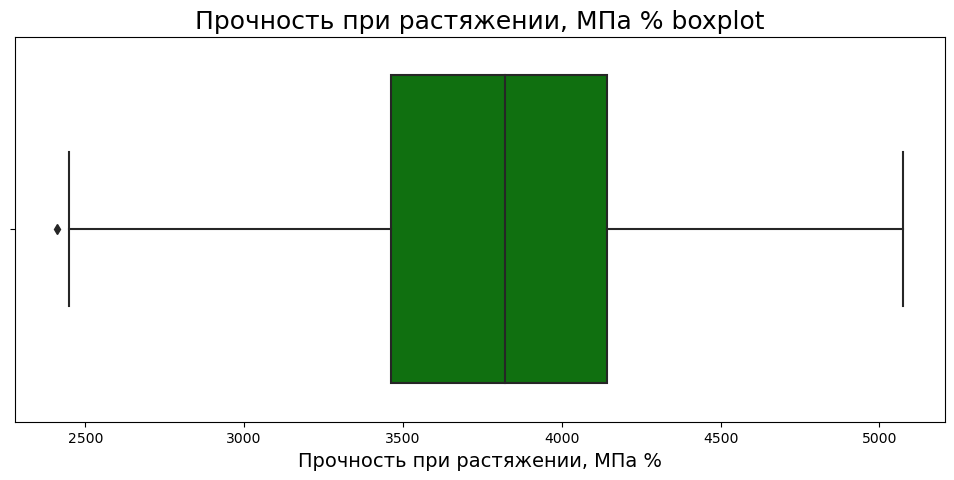

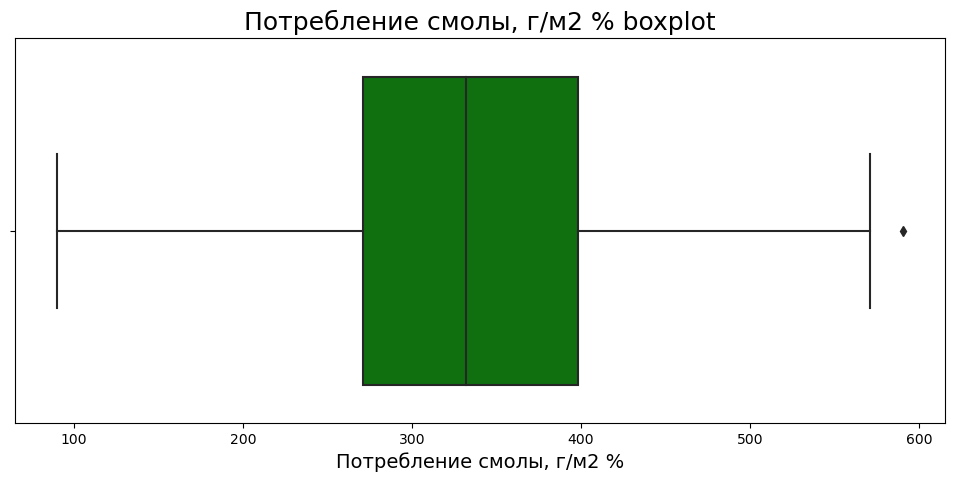

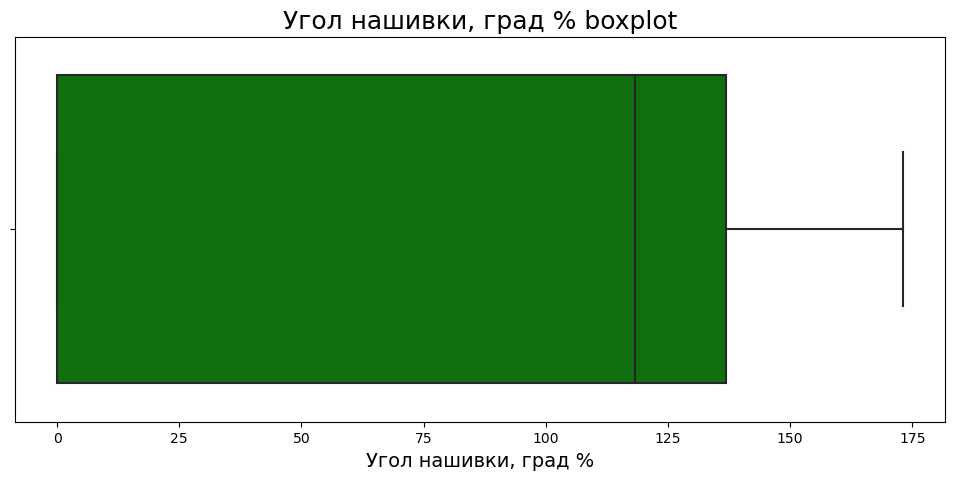

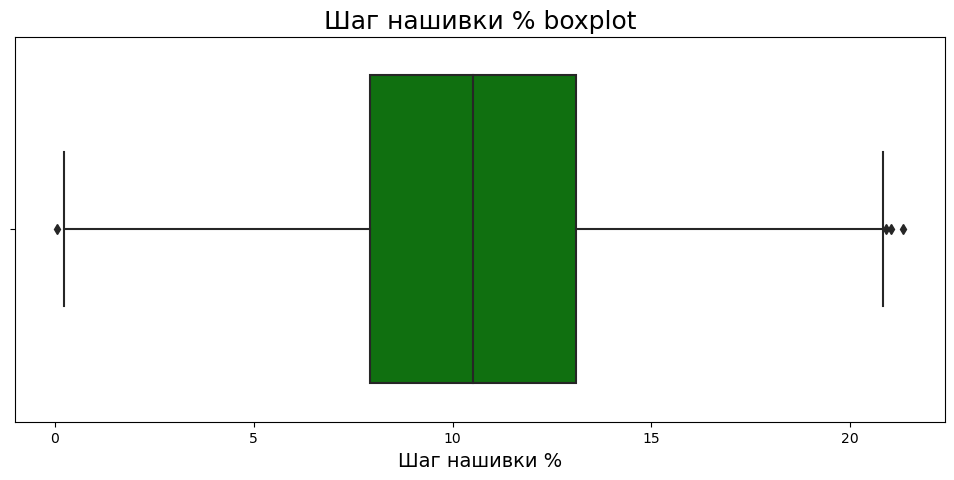

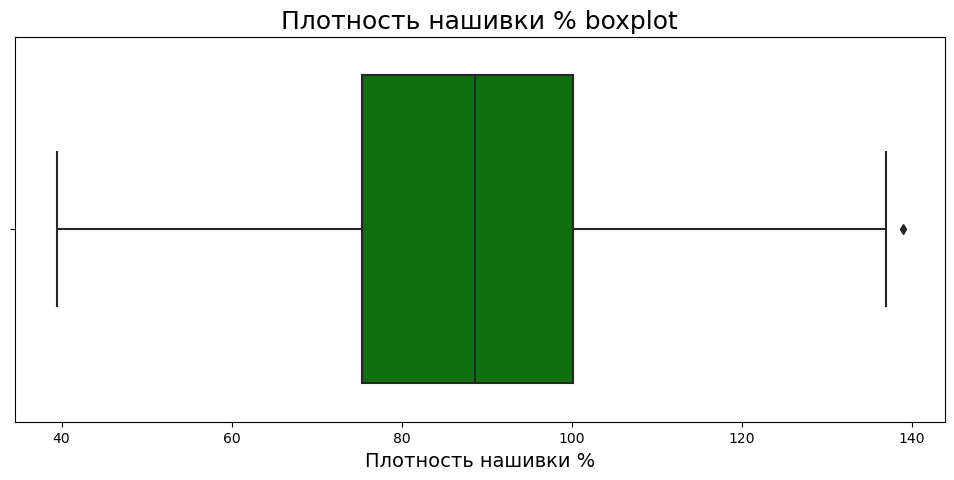

In [46]:
for col_name in df_actual:
    plt.figure(figsize=(12, 5))
    sns.boxplot(x=df_actual[col_name],color = 'green')
    plt.title(col_name + " boxplot", fontsize=18)
    plt.xlabel(col_name, fontsize=14)
    plt.show()

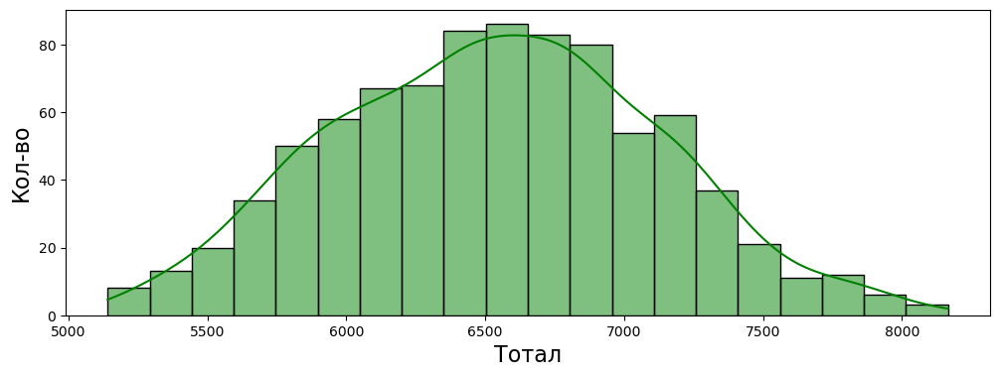

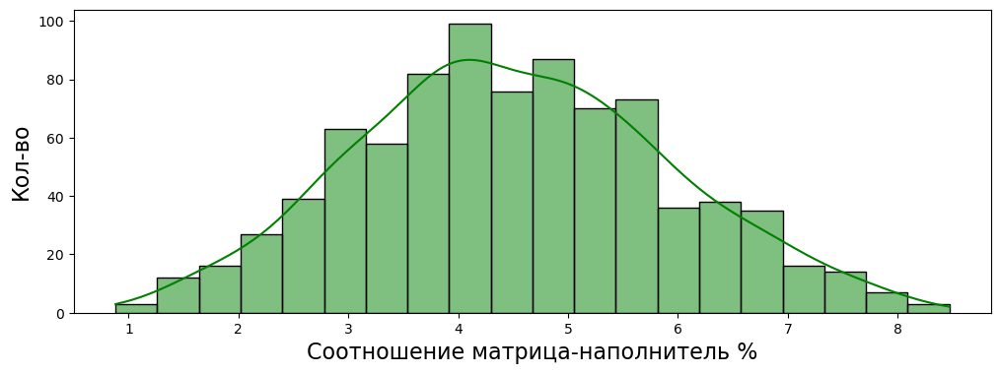

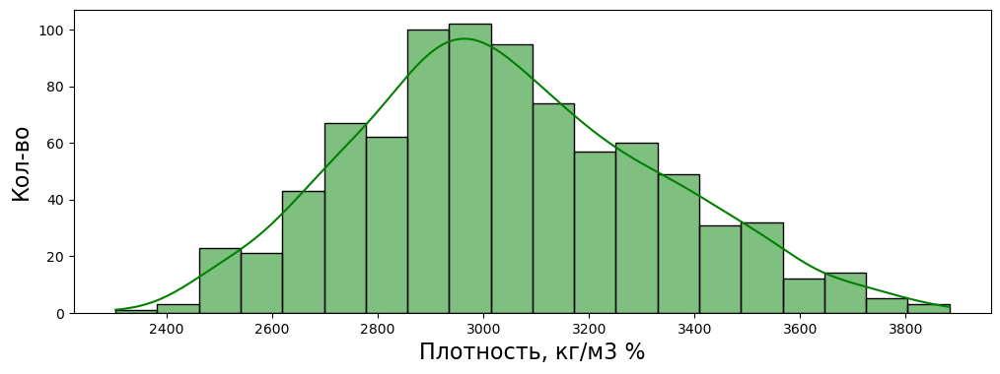

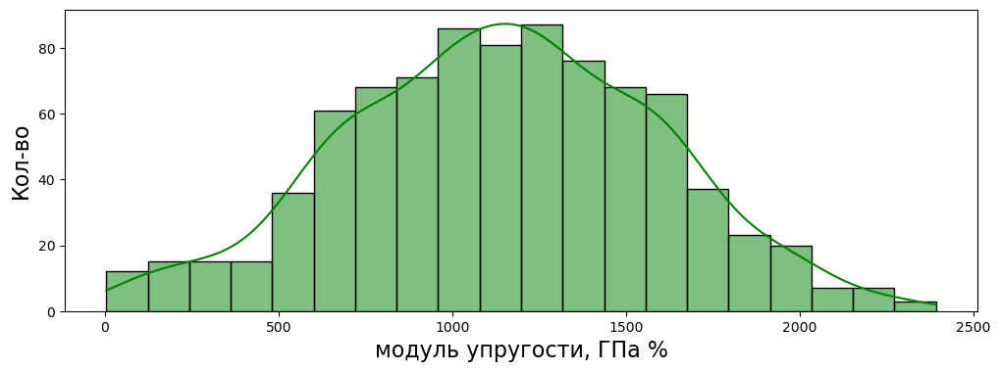

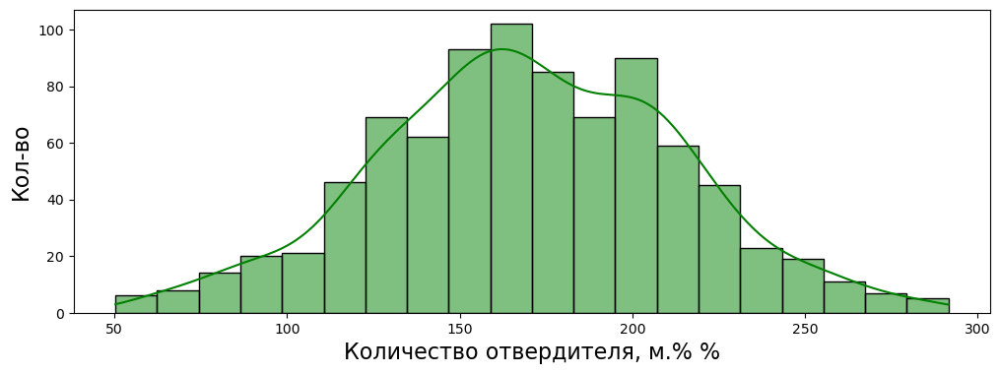

...

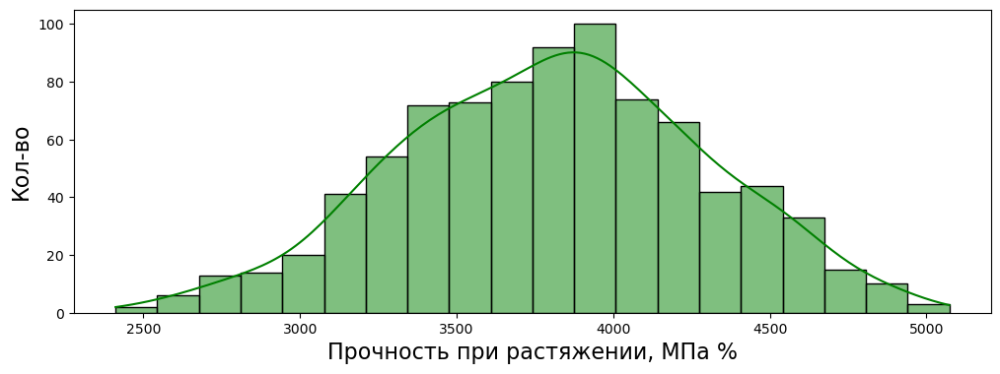

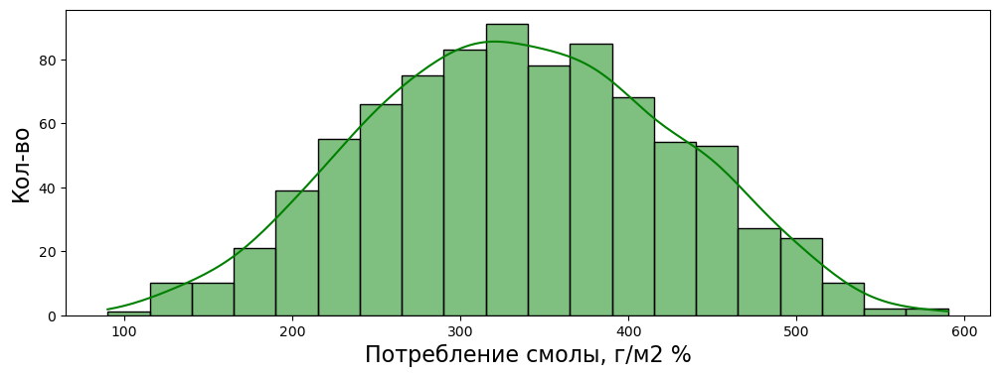

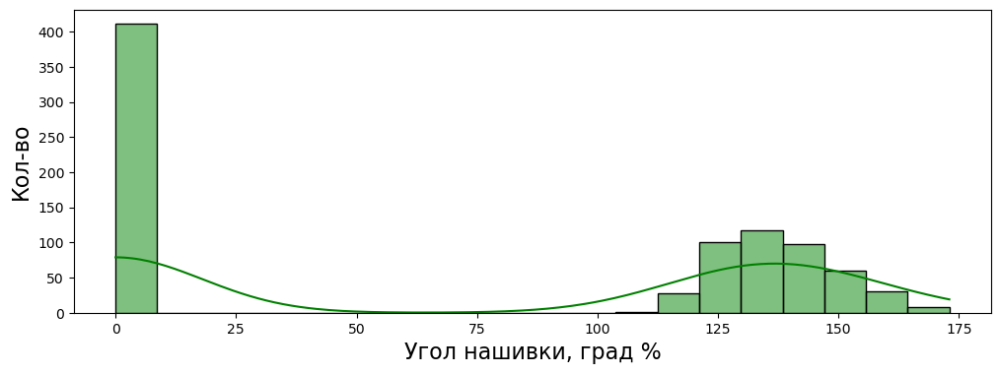

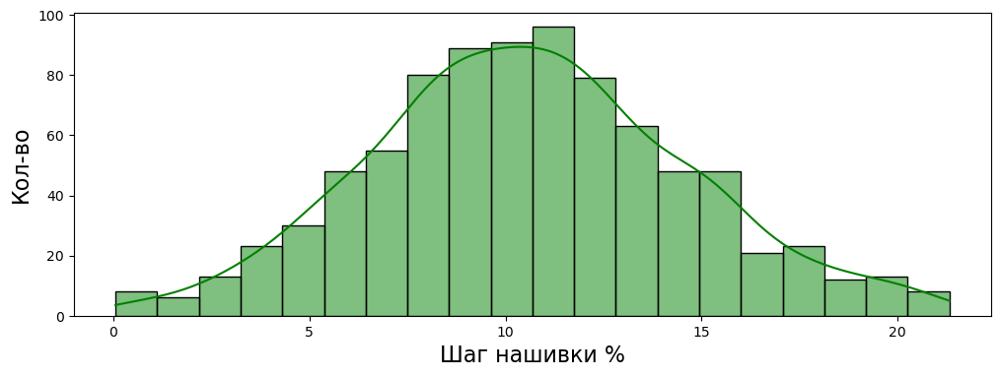

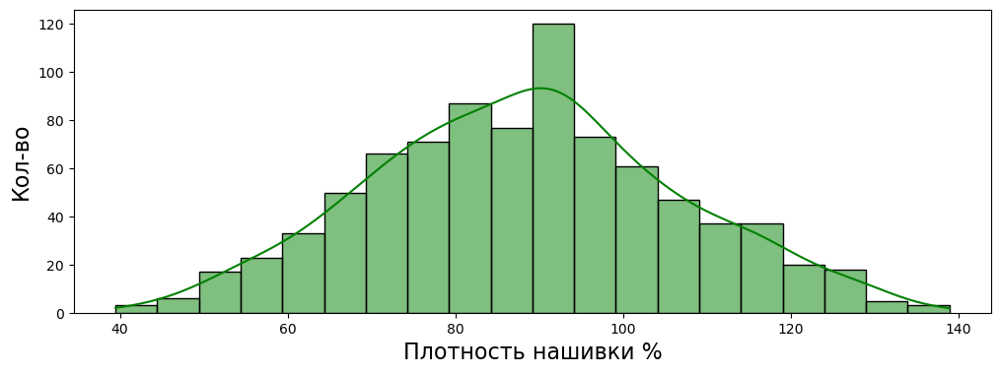

In [47]:
for col_name in df_actual:

    
    plt.figure(figsize=(12, 4))
    sns.histplot(x=col_name, kde=True, bins=20, color = 'green',data=df_actual)
    
    plt.xlabel(col_name, fontsize=16)
    plt.ylabel("Кол-во", fontsize=16)
    plt.show()

In [48]:
df_actual

,Тотал,Соотношение матрица-наполнитель %,"Плотность, кг/м3 %","модуль упругости, ГПа %","Количество отвердителя, м.% %","Содержание эпоксидных групп,%_2 %","Температура вспышки, С_2 %","Поверхностная плотность, г/м2 %","Модуль упругости при растяжении, ГПа %","Прочность при растяжении, МПа %","Потребление смолы, г/м2 %","Угол нашивки, град %",Шаг нашивки %,Плотность нашивки %
8,5711.807018,6.227482,3378.965700,1556.425134,225.847967,37.203638,525.227829,665.288584,131.306957,3151.366975,210.091132,0.000000,12.255316,99.793288
23,7121.800019,3.632997,2742.670282,1595.939414,193.248082,31.374840,329.575223,780.551900,113.458987,3632.990221,346.279193,126.372546,5.616558,98.289758
25,6759.963267,3.027341,3014.264620,1046.708183,150.322195,34.240412,461.995418,810.065376,109.197437,3881.716961,263.608764,133.136818,7.396490,84.319985
26,6325.422743,2.934944,3190.648931,1322.116190,214.059521,41.792487,517.768361,238.658276,122.064192,3909.916056,194.998131,142.282980,7.904610,94.855320
27,6949.961637,4.756192,2759.594378,688.185450,152.212250,25.718271,472.167469,757.834628,104.095120,4401.510614,396.514246,129.497118,7.194284,100.719980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,6239.790775,3.640100,3128.450892,1462.958580,139.415224,32.249877,520.489529,335.265568,117.136878,3825.917536,200.339520,144.235605,14.545969,75.354723
1019,5974.083917,5.764938,3431.637719,744.436536,244.358767,32.807990,425.530348,586.970044,122.061939,3951.053946,197.068036,150.650713,17.685748,89.973275
1020,6651.584796,4.932064,2965.267565,626.672494,166.176153,36.017735,373.479486,1112.731497,112.355696,4003.415910,355.714873,135.306100,6.255884,101.674543
1021,6387.332445,5.801093,3235.779240,1160.853178,221.372481,30.132994,431.760585,1004.281768,115.921175,3243.475854,308.620333,140.903892,9.883939,91.213467


## Обучим модель для прогноза модуля упругости  при растяжении

### Разделение на обучающие и тестовые наборы

In [49]:
X = df_actual.drop(['Модуль упругости при растяжении, ГПа %', 'Тотал','Шаг нашивки %'], axis=1)
y = df_actual['Модуль упругости при растяжении, ГПа %']

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.3, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(597, 11) (257, 11) (597,) (257,)


In [50]:
pt = PowerTransformer()
X_train = pd.DataFrame(pt.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(pt.transform(X_test), columns=X_test.columns)

In [51]:
#### Нормализация и масштабирование функций. Трансформация Йео-Джонсона

In [52]:
feature_scaler = MinMaxScaler()
X_train = pd.DataFrame(feature_scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(feature_scaler.transform(X_test),columns=X_test.columns)

In [53]:
X_test

,Соотношение матрица-наполнитель %,"Плотность, кг/м3 %","модуль упругости, ГПа %","Количество отвердителя, м.% %","Содержание эпоксидных групп,%_2 %","Температура вспышки, С_2 %","Поверхностная плотность, г/м2 %","Прочность при растяжении, МПа %","Потребление смолы, г/м2 %","Угол нашивки, град %",Плотность нашивки %
0,0.324796,0.335888,0.525366,0.618135,0.361753,0.518364,0.387277,0.815360,0.310215,0.000000,0.368201
1,0.414655,0.491865,0.574490,0.437276,0.419723,0.647475,0.633260,0.430989,0.299366,0.941621,0.320921
2,0.573881,0.566495,0.529423,0.382170,0.594005,0.473169,0.764097,0.363082,0.440369,0.000000,0.554772
3,0.711356,0.687320,0.286092,0.675256,0.746467,0.495558,0.548375,0.619063,0.739457,0.000000,0.091287
4,0.477990,0.271885,0.286468,0.751571,0.453620,0.534746,0.412852,0.919417,0.670444,0.934185,0.330948
...,...,...,...,...,...,...,...,...,...,...,...
252,0.353584,0.799536,0.315306,0.412882,0.727144,0.821723,0.749168,0.350016,0.559086,0.000000,0.219965
253,0.439198,0.852941,0.235747,0.490556,0.547956,0.572824,0.221700,0.755506,0.813887,0.000000,0.350176
254,0.334963,0.652963,0.628323,0.682989,0.628304,0.451547,0.762108,0.208142,0.348260,0.000000,0.668912
255,0.440503,0.470298,0.323914,0.599187,0.613856,0.357261,0.842008,0.506135,0.655528,0.000000,0.519048


### Ridge regression

In [54]:
# Создадим списки для хранения результатов проверки протестированных моделей
r2_scores = {}
mae_scores = {}
rmse_scores = {}



#### Гиперпараметры для поиска по сетке

In [55]:
params = [{'alpha': [0.0004, 0.0003, 0.0002, 0.0001],
           "solver": ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']}]

#### Поиск по сетке с перекрестной проверкой

In [56]:
ridge_reg = Ridge()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=42)

cv = GridSearchCV(estimator=ridge_reg,param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Ridge(), n_jobs=-1,
             param_grid=[{'alpha': [0.0004, 0.0003, 0.0002, 0.0001],
                          'solver': ['svd', 'cholesky', 'lsqr', 'sparse_cg',
                                     'sag', 'saga']}],
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [57]:
print("Лучший параметр для гребневой регрессии:")
print(cv.best_params_)
print("Лучший средний балл перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для гребневой регрессии:
{'alpha': 0.0004, 'solver': 'lsqr'}
Лучший средний балл перекрестной проверки:
-6.029155584732317


#### Оценка  по полному набору данных

In [58]:
alpha = cv.best_params_['alpha']
solver = cv.best_params_['solver']

ridge_reg = Ridge(alpha=alpha, solver=solver)
ridge_reg.fit(X_train, y_train)

y_pred = ridge_reg.predict(X_test)

ridge_r2 = r2_score(y_test, y_pred)
ridge_mae = mean_absolute_error(y_test, y_pred)
ridge_rmse = mean_squared_error(y_test, y_pred, squared=False)
print("---RIDGE REGRESSION---")
print("R2 score: "+str(ridge_r2))
print("Mean Absolute Error: "+str(ridge_mae))
print("Root Mean Squared Error: "+str(ridge_rmse))

r2_scores["ridge_regression"] = ridge_r2
mae_scores["ridge_regression"] = ridge_mae
rmse_scores["ridge_regression"] = ridge_rmse

---RIDGE REGRESSION---
R2 score: 0.7516597301260943
Mean Absolute Error: 4.36711571524579
Root Mean Squared Error: 5.404568830933122


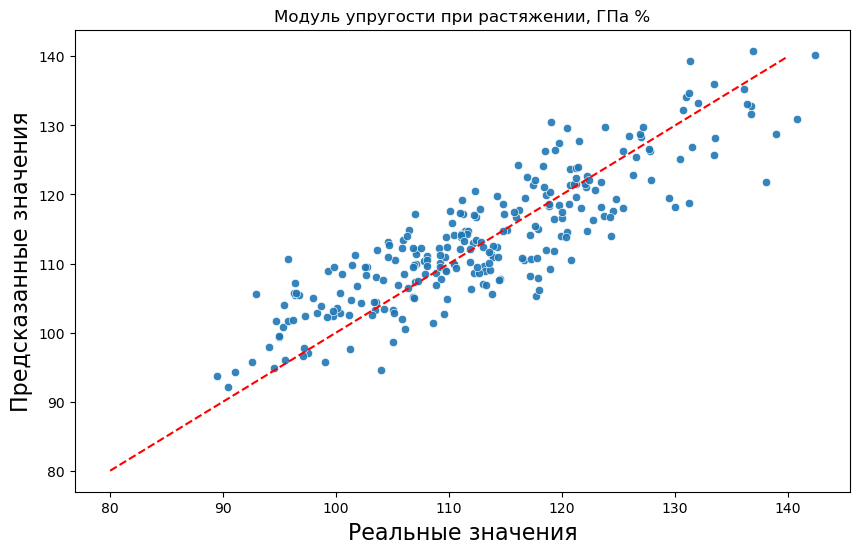

In [59]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.9)
line_X = np.linspace(80, 140, 140)
line_Y = line_X
plt.plot(line_X, line_Y, 'r--')
plt.title("Модуль упругости при растяжении, ГПа %", fontsize=12)
plt.xlabel('Реальные значения', fontsize=16)
plt.ylabel('Предсказанные значения', fontsize=16)
plt.show()

In [60]:
f = pd.DataFrame({'Актуальные': y_test, 'Предсказанные': y_pred})
f


,Актуальные,Предсказанные
98,95.303293,100.808061
548,114.530026,107.744088
263,112.149924,112.991020
280,114.196785,119.764586
956,95.772454,101.665309
...,...,...
187,130.400799,125.164789
123,127.708729,126.613041
221,119.303526,116.467945
220,95.746823,110.590473


### Lasso regression

#### Гиперпараметры для поиска по сетке

In [61]:
params = [{'alpha': [0.0006, 0.0005, 0.0004,0.0003,0.0002,0.0001]}]

#### Поиск по сетке с перекрестной проверкой

In [62]:
lasso_reg = Lasso(max_iter=5000)
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=lasso_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=Lasso(max_iter=5000), n_jobs=-1,
             param_grid=[{'alpha': [0.0006, 0.0005, 0.0004, 0.0003, 0.0002,
                                    0.0001]}],
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [63]:
print("Лучший параметр для Лассо регрессии :")
print(cv.best_params_)
print("Наилучший средний показатель перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для Лассо регрессии :
{'alpha': 0.0006}
Наилучший средний показатель перекрестной проверки:
-6.029203621671508


#### Оценка по полному набору данных

In [64]:
alpha = cv.best_params_['alpha']

lasso_reg = Lasso(max_iter=5000, alpha=alpha)
lasso_reg.fit(X_train, y_train)

y_pred = lasso_reg.predict(X_test)
lasso_r2 = r2_score(y_test, y_pred)
lasso_mae = mean_absolute_error(y_test, y_pred)
lasso_rmse = mean_squared_error(y_test, y_pred, squared=False)
print("---LASSO REGRESSION---")
print("R2 score: "+str(lasso_r2))
print("Mean Absolute Error: "+str(lasso_mae))
print("Root Mean Squared Error: "+str(lasso_rmse))

r2_scores["lasso_regression"] = lasso_r2
mae_scores["lasso_regression"] = lasso_mae
rmse_scores["lasso_regression"] = lasso_rmse

---LASSO REGRESSION---
R2 score: 0.7510249441609602
Mean Absolute Error: 4.372434674806533
Root Mean Squared Error: 5.4114717687802045


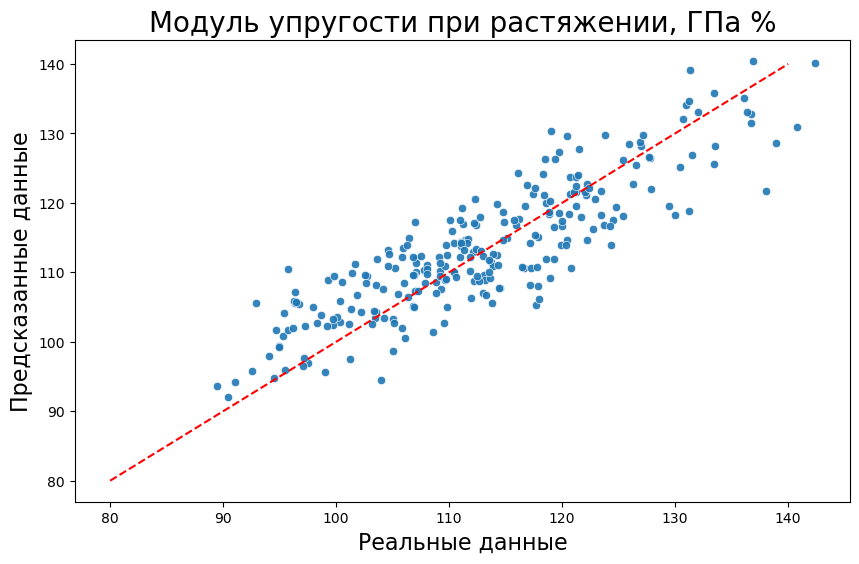

In [65]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.9)
line_X = np.linspace(80, 140, 140)
line_Y = line_X
plt.plot(line_X, line_Y, 'r--')
plt.title("Модуль упругости при растяжении, ГПа %", fontsize=20)
plt.xlabel('Реальные данные', fontsize=16)
plt.ylabel('Предсказанные данные', fontsize=16)
plt.show()

## GradientBoostingRegressor

In [66]:
reg = GradientBoostingRegressor(random_state=0)
reg.fit(X_train, y_train)

y_pred = reg.predict(X_test)
reg_r2 = r2_score(y_test, y_pred)
reg_mae = mean_absolute_error(y_test, y_pred)
reg_rmse = mean_squared_error(y_test, y_pred, squared=False)

print("---GradientBoostingRegressor---")
print("R2 score: "+str(reg_r2))
print("Mean Absolute Error: "+str(reg_mae))
print("Root Mean Squared Error: "+str(reg_rmse))

r2_scores["GradientBoostingRegressor"] = reg_r2
mae_scores["GradientBoostingRegressor"] = reg_mae
rmse_scores["GradientBoostingRegressor"] = reg_rmse

---GradientBoostingRegressor---
R2 score: 0.7368530623773486
Mean Absolute Error: 4.496646568881189
Root Mean Squared Error: 5.5633532666145555


## RandomForestRegressor

In [67]:
rforest_reg = RandomForestRegressor()
rforest_reg.fit(X_train, y_train)

y_pred = rforest_reg.predict(X_test)

rforest_r2 = r2_score(y_test, y_pred)
rforest_mae = mean_absolute_error(y_test, y_pred)
rforest_rmse = mean_squared_error(y_test, y_pred, squared=False)
print("---RANDOM FOREST REGRESSOR---")
print("R2 score: "+str(rforest_r2))
print("Mean Absolute Error: "+str(rforest_mae))
print("Root Mean Squared Error: "+str(rforest_rmse))

r2_scores["random_forest"] = rforest_r2
mae_scores["random_forest"] = rforest_mae
rmse_scores["random_forest"] = rforest_rmse

---RANDOM FOREST REGRESSOR---
R2 score: 0.7322519080051961
Mean Absolute Error: 4.613136288064151
Root Mean Squared Error: 5.611780430167033


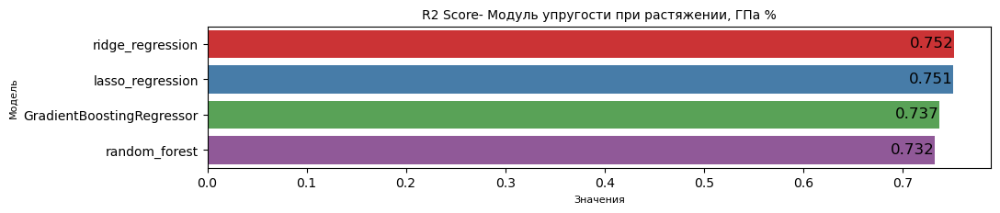

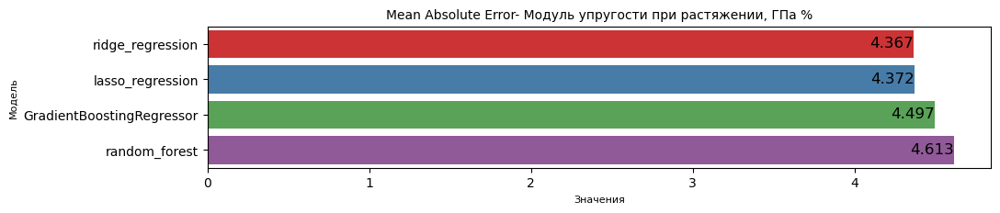

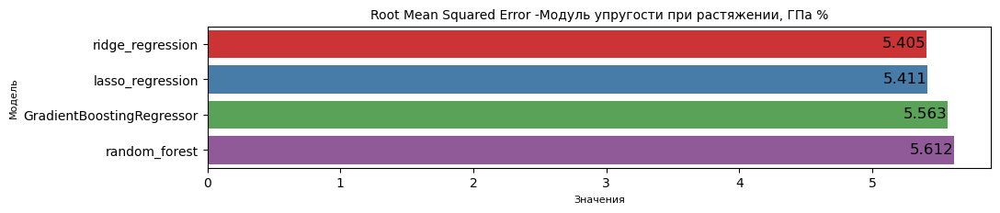

In [68]:
#визуализируем наши метрики
scores = [r2_scores, mae_scores, rmse_scores]
titles = ['R2 Score- Модуль упругости при растяжении, ГПа %', 'Mean Absolute Error- Модуль упругости при растяжении, ГПа %', 'Root Mean Squared Error -Модуль упругости при растяжении, ГПа %']

for i in range(len(scores)):
    plt.figure(figsize=(11, 2))
    graph = sns.barplot(x=list(scores[i].values()), y=list(
        scores[i].keys()), palette="Set1")
    plt.title(titles[i], fontsize=10)
    plt.xlabel("Значения", fontsize=8)
    plt.ylabel("Модель", fontsize=8)
   
    for p in graph.patches:
        if not math.isnan(p.get_width()):
            x = p.get_width() - graph.patches[0].get_width()*0
            y = p.get_y() + p.get_height() - 0.3
            value = round(p.get_width(), 3)
            graph.text(x, y, value, ha="right", color='black', size='large')    
    plt.show()
   

## Обучим модель для прогноза прочности при растяжении

In [69]:
X_1 = df_actual.drop(['Прочность при растяжении, МПа %','Тотал','Угол нашивки, град %'], axis=1)
y_1 = df_actual['Прочность при растяжении, МПа %']


X_train, X_test, y_train, y_test = train_test_split(X_1, y_1, test_size=0.3, random_state=2)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(597, 11) (257, 11) (597,) (257,)


In [70]:
pt = PowerTransformer()

X_train = pd.DataFrame(pt.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(pt.transform(X_test), columns=X_test.columns)

In [71]:
feature_scaler = MinMaxScaler()
X_train = pd.DataFrame(feature_scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(feature_scaler.transform(X_test),columns=X_train.columns)

### Ridge regression

In [72]:
r2_scores = {}
mae_scores = {}
rmse_scores = {}

#### Гиперпараметры для поиска по сетке

In [73]:
params = [{'alpha': [0.0004, 0.0003, 0.0002, 0.0001],
           "solver": ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']}]

#### Поиск по сетке с перекрестной проверкой

In [74]:
ridge_reg = Ridge()
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=ridge_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=Ridge(), n_jobs=-1,
             param_grid=[{'alpha': [0.0004, 0.0003, 0.0002, 0.0001],
                          'solver': ['svd', 'cholesky', 'lsqr', 'sparse_cg',
                                     'sag', 'saga']}],
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [75]:
print("Лучший параметр для гребневой регрессии:")
print(cv.best_params_)
print("Лучший средний балл перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для гребневой регрессии:
{'alpha': 0.0002, 'solver': 'sag'}
Лучший средний балл перекрестной проверки:
-85.24180761932563


####  Оценка по полному набору данных 

In [76]:
alpha = cv.best_params_['alpha']
solver = cv.best_params_['solver']

ridge_reg = Ridge(alpha=alpha,solver=solver)
ridge_reg.fit(X_train, y_train)

y_pred = ridge_reg.predict(X_test)
ridge_r2 = r2_score(y_test, y_pred)
ridge_mae = mean_absolute_error(y_test, y_pred)
ridge_rmse = mean_squared_error(y_test, y_pred, squared=False)
print("---RIDGE REGRESSION---")
print("R2 score: "+str(ridge_r2))
print("Mean Absolute Error: "+str(ridge_mae))
print("Root Mean Squared Error: "+str(ridge_rmse))

r2_scores["ridge_regression"] = ridge_r2
mae_scores["ridge_regression"] = ridge_mae
rmse_scores["ridge_regression"] = ridge_rmse

---RIDGE REGRESSION---
R2 score: 0.9675496293964267
Mean Absolute Error: 70.10449633255243
Root Mean Squared Error: 87.66454339426696


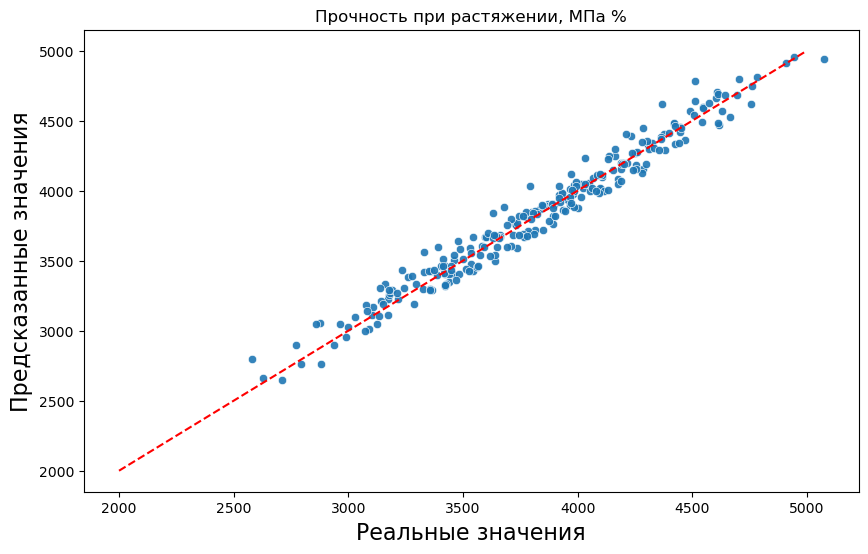

In [77]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.9)
line_X = np.linspace(2000, 5000, 5000)
line_Y = line_X
plt.plot(line_X, line_Y, 'r--')
plt.title("Прочность при растяжении, МПа %", fontsize=12)
plt.xlabel('Реальные значения', fontsize=16)
plt.ylabel('Предсказанные значения', fontsize=16)
plt.show()

### Lasso regression

In [78]:
lasso_reg = Lasso(max_iter=5000)

#### Гиперпараметры для поиска по сетке

In [79]:
params = [{'alpha': [0.0006, 0.0005, 0.0004,0.0003,0.0002,0.0001]}]

#### Поиск по сетке с перекрестной проверкой

In [80]:
%%time
cv_scheme = KFold(n_splits=10, shuffle=True, random_state=1)
cv = GridSearchCV(estimator=lasso_reg, param_grid=params,
                  scoring='neg_root_mean_squared_error', cv=cv_scheme, return_train_score=True, n_jobs=-1)

cv.fit(X_train, y_train)

CPU times: total: 78.1 ms
Wall time: 70.8 ms


GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=Lasso(max_iter=5000), n_jobs=-1,
             param_grid=[{'alpha': [0.0006, 0.0005, 0.0004, 0.0003, 0.0002,
                                    0.0001]}],
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [81]:
print("Лучший параметр для гребневой регрессии:")
print(cv.best_params_)
print("Лучший средний балл перекрестной проверки:")
print(cv.best_score_)

Лучший параметр для гребневой регрессии:
{'alpha': 0.0006}
Лучший средний балл перекрестной проверки:
-85.24487330311379


#### Оценка по полному набору данных

In [82]:
alpha = cv.best_params_['alpha']

lasso_reg = Lasso(max_iter=5000, alpha=alpha)
lasso_reg.fit(X_train, y_train)

y_pred = lasso_reg.predict(X_test)
lasso_r2 = r2_score(y_test, y_pred)
lasso_mae = mean_absolute_error(y_test, y_pred)
lasso_rmse = mean_squared_error(y_test, y_pred, squared=False)
print("---LASSO REGRESSION---")
print("R2 score: "+str(lasso_r2))
print("Mean Absolute Error: "+str(lasso_mae))
print("Root Mean Squared Error: "+str(lasso_rmse))

r2_scores["lasso_regression"] = lasso_r2
mae_scores["lasso_regression"] = lasso_mae
rmse_scores["lasso_regression"] = lasso_rmse

---LASSO REGRESSION---
R2 score: 0.9675495067486103
Mean Absolute Error: 70.10542641469702
Root Mean Squared Error: 87.66470906039756


In [83]:
f = pd.DataFrame({'Актуальные': y_test, 'Предсказанные': y_pred})
f


,Актуальные,Предсказанные
838,3838.330001,3868.416638
854,3721.639373,3772.856362
326,4762.439787,4746.201171
571,3663.306792,3685.718521
561,3499.185738,3515.113375
...,...,...
890,4365.196782,4369.705730
566,3388.291186,3400.893409
359,3126.192922,3048.276888
761,3373.007847,3436.692570


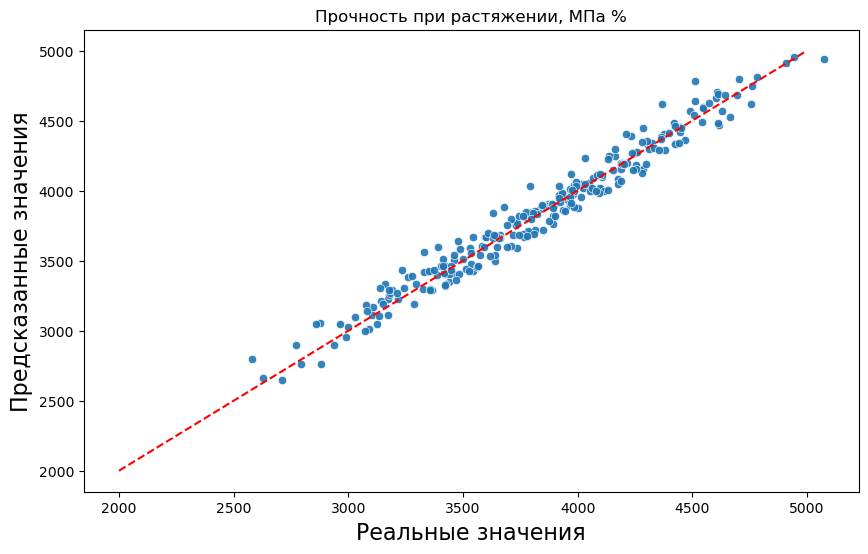

In [84]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.9)
line_X = np.linspace(2000, 5000, 5000)
line_Y = line_X
plt.plot(line_X, line_Y, 'r--')
plt.title("Прочность при растяжении, МПа %", fontsize=12)
plt.xlabel('Реальные значения', fontsize=16)
plt.ylabel('Предсказанные значения', fontsize=16)
plt.show()

## GradientBoostingRegressor

In [85]:
reg = GradientBoostingRegressor(random_state=0)
reg.fit(X_train, y_train)

y_pred = reg.predict(X_test)
reg_r2 = r2_score(y_test, y_pred)
reg_mae = mean_absolute_error(y_test, y_pred)
reg_rmse = mean_squared_error(y_test, y_pred, squared=False)

print("---GradientBoostingRegressor---")
print("R2 score: "+str(reg_r2))
print("Mean Absolute Error: "+str(reg_mae))
print("Root Mean Squared Error: "+str(reg_rmse))

r2_scores["GradientBoostingRegressor"] = reg_r2
mae_scores["GradientBoostingRegressor"] = reg_mae
rmse_scores["GradientBoostingRegressor"] = reg_rmse

---GradientBoostingRegressor---
R2 score: 0.9175095810036573
Mean Absolute Error: 109.47299744589148
Root Mean Squared Error: 139.7706224769609


## RandomForestRegressor

In [86]:
rforest_reg = RandomForestRegressor()
rforest_reg.fit(X_train, y_train)

y_pred = rforest_reg.predict(X_test)

rforest_r2 = r2_score(y_test, y_pred)
rforest_mae = mean_absolute_error(y_test, y_pred)
rforest_rmse = mean_squared_error(y_test, y_pred, squared=False)
print("---RANDOM FOREST REGRESSOR---")
print("R2 score: "+str(rforest_r2))
print("Mean Absolute Error: "+str(rforest_mae))
print("Root Mean Squared Error: "+str(rforest_rmse))

r2_scores["random_forest"] = rforest_r2
mae_scores["random_forest"] = rforest_mae
rmse_scores["random_forest"] = rforest_rmse

---RANDOM FOREST REGRESSOR---
R2 score: 0.8456664716316434
Mean Absolute Error: 150.06413674449914
Root Mean Squared Error: 191.18080551835993


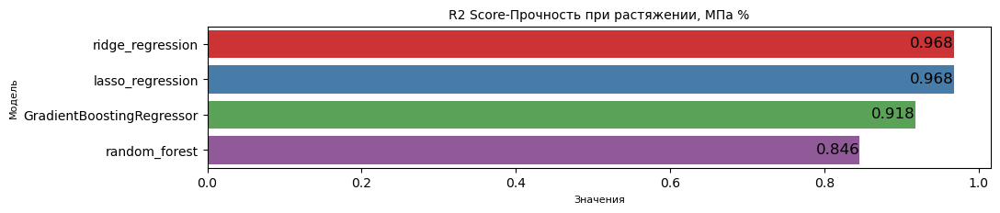

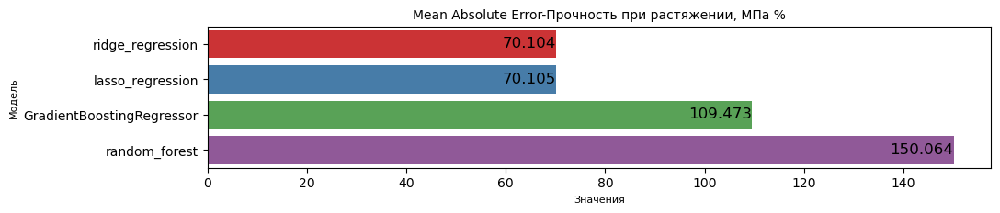

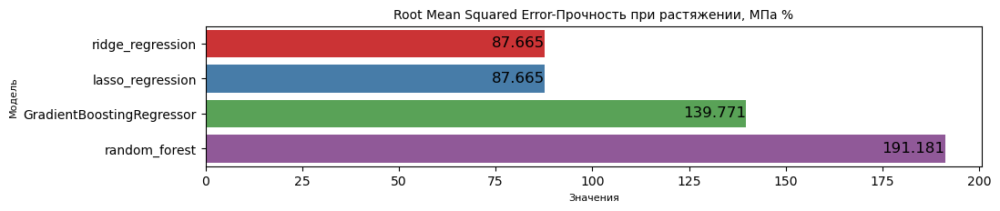

In [87]:
#Визуализация ошибок и метрик всех моделей
scores = [r2_scores, mae_scores, rmse_scores]
titles = ['R2 Score-Прочность при растяжении, МПа %', 'Mean Absolute Error-Прочность при растяжении, МПа %', 'Root Mean Squared Error-Прочность при растяжении, МПа %']

for i in range(len(scores)):
    plt.figure(figsize=(11, 2))
    graph = sns.barplot(x=list(scores[i].values()), y=list(
        scores[i].keys()), palette="Set1")
    plt.title(titles[i], fontsize=10)
    plt.xlabel("Значения", fontsize=8)
    plt.ylabel("Модель", fontsize=8)
   
    for p in graph.patches:
        if not math.isnan(p.get_width()):
            x = p.get_width() - graph.patches[0].get_width()*0
            y = p.get_y() + p.get_height() - 0.3
            value = round(p.get_width(), 3)
            graph.text(x, y, value, ha="right", color='black', size='large')    
    plt.show()
   

#### Использовалась Tensorflow Keras, для целей обучения я буду тестировать линейную регрессию и регрессию DNN , которая содержит информацию о различных компонентах  с целью определения соотношение матрица-наполнитель %.

In [88]:
df_dnn = df_actual.drop(['Тотал'], axis=1)

In [89]:
train = df_dnn.sample(frac=0.8, random_state= 42)
test = df_dnn.drop(train.index)

In [90]:
##Разделим данные на обучающие и тестовые  выборки, а затем отделим объекты от целевой переменной

In [91]:
train_features = train.copy()
test_features = test.copy()

train_labels = train_features.pop('Соотношение матрица-наполнитель %')
test_labels = test_features.pop('Соотношение матрица-наполнитель %')

print(train_labels.head(), test_labels.head(), train_features.head(), test_features.head())

98     2.943685
548    3.591091
263    4.809635
280    5.929988
956    4.065195
Name: Соотношение матрица-наполнитель %, dtype: float64 23    3.632997
27    4.756192
36    4.297328
38    3.562219
46    2.893226
Name: Соотношение матрица-наполнитель %, dtype: float64      Плотность, кг/м3 %  модуль упругости, ГПа %  \
98          2710.766378              1240.075911   
548         2929.084772              1358.388153   
263         3040.903272              1249.836033   
280         3232.879561               668.004878   
956         2626.810599               668.896851   

     Количество отвердителя, м.% %  Содержание эпоксидных групп,%_2 %  \
98                      197.510157                          28.792975   
548                     153.638642                          30.307423   
263                     140.374501                          35.153481   
280                     211.461515                          39.764013   
956                     230.164134                     

In [92]:
train_features.describe().transpose()[['mean', 'std']]

,mean,std
"Плотность, кг/м3 %",3051.405030,293.053512
"модуль упругости, ГПа %",1127.631522,447.943521
"Количество отвердителя, м.% %",171.584799,43.441225
"Содержание эпоксидных групп,%_2 %",34.339894,4.837595
"Температура вспышки, С_2 %",442.095366,71.087405
"Поверхностная плотность, г/м2 %",724.401164,396.280605
"Модуль упругости при растяжении, ГПа %",113.183044,11.083098
"Прочность при растяжении, МПа %",3822.066996,494.264998
"Потребление смолы, г/м2 %",338.627929,89.245734
"Угол нашивки, град %",70.810129,69.499224


In [93]:
normalizer = preprocessing.Normalization()
normalizer.adapt(np.array(train_features))
print(normalizer.mean.numpy())

[[3051.405    1127.6315    171.58484    34.339893  442.0953    724.4011
   113.183044 3822.0674    338.62793    70.810135   10.537713   88.78158 ]]


In [94]:
print(train_features[:1])
print(normalizer(np.array(train_features[:2])).numpy())

    Плотность, кг/м3 %  модуль упругости, ГПа %  \
98         2710.766378              1240.075911   

    Количество отвердителя, м.% %  Содержание эпоксидных групп,%_2 %  \
98                     197.510157                          28.792975   

    Температура вспышки, С_2 %  Поверхностная плотность, г/м2 %  \
98                  428.865652                       486.775966   

    Модуль упругости при растяжении, ГПа %  Прочность при растяжении, МПа %  \
98                               95.303293                      4490.641453   

    Потребление смолы, г/м2 %  Угол нашивки, град %  Шаг нашивки %  \
98                 240.998437                   0.0       1.987122   

    Плотность нашивки %  
98            75.338969  
[[-1.1632289   0.2512077   0.59722817 -1.1474677  -0.1862403  -0.6000781
  -1.6144273   1.3536547  -1.0947418  -1.019609   -2.1141639  -0.72566307]
 [-0.41770515  0.51552445 -0.4134172  -0.83418024  0.5276927   0.57909006
   0.12162412 -0.5952917  -1.15496     0.83

### Линейная регрессия


##### Будет использоваться последовательная модель

In [95]:
linear_model = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
]) 

In [96]:
linear_model.predict(train_features) 

22/22 [==============================] - 0s 475us/step


array([[ 2.57392812e+00],
       [-1.22694600e+00],
       [-1.16792452e+00],
       [ 1.77225447e+00],
       [ 1.97678816e+00],
       [-1.77255976e+00],
       [-1.74779737e+00],
       [ 3.76075506e-02],
       [-3.43413055e-01],
       [ 6.57411039e-01],
       [-1.25232053e+00],
       [-9.57808018e-01],
       [-2.37591267e-01],
       [-4.87418175e-01],
       [ 2.17750883e+00],
       [ 3.72038186e-01],
       [-1.70349991e+00],
       [-1.30997705e+00],
       [-1.29120636e+00],
       [ 1.21612465e+00],
       [ 1.28439426e+00],
       [ 4.17946219e-01],
       [-2.48302042e-01],
       [-1.70930529e+00],
       [-3.09472620e-01],
       [-8.72209907e-01],
       [ 1.07584953e+00],
       [ 6.43530667e-01],
       [ 1.15346050e+00],
       [-1.60517693e-01],
       [-2.05964923e+00],
       [ 4.79675889e-01],
       [ 1.74752784e+00],
       [-1.83339512e+00],
       [-1.32965803e+00],
       [-3.84575665e-01],
       [ 1.66554940e+00],
       [ 1.18822247e-01],
       [ 1.1

In [97]:
linear_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error')###Использование алгоритма оптимизации Adam для обновления весов сети

In [98]:
history = linear_model.fit(
    train_features, train_labels, 
    epochs=25,
    verbose=1,
    validation_split = 0.2)

Epoch 1/25
18/18 [==============================] - 0s 6ms/step - loss: 3.8043 - val_loss: 2.9764
Epoch 2/25
18/18 [==============================] - 0s 2ms/step - loss: 2.1870 - val_loss: 1.5061
Epoch 3/25
18/18 [==============================] - 0s 2ms/step - loss: 1.3542 - val_loss: 1.3302
Epoch 4/25
18/18 [==============================] - 0s 2ms/step - loss: 1.2464 - val_loss: 1.2376
Epoch 5/25
18/18 [==============================] - 0s 2ms/step - loss: 1.2285 - val_loss: 1.1982
Epoch 6/25
18/18 [==============================] - 0s 2ms/step - loss: 1.2079 - val_loss: 1.1228
Epoch 7/25
18/18 [==============================] - 0s 2ms/step - loss: 1.1999 - val_loss: 1.1603
Epoch 8/25
18/18 [==============================] - 0s 2ms/step - loss: 1.1963 - val_loss: 1.2371
Epoch 9/25
18/18 [==============================] - 0s 2ms/step - loss: 1.2176 - val_loss: 1.1286
Epoch 10/25
18/18 [==============================] - 0s 2ms/step - loss: 1.2003 - val_loss: 1.1899
Epoch 11/25
18/18 [

In [99]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
20,1.235632,1.128444,20
21,1.192852,1.134682,21
22,1.200940,1.179607,22
23,1.242911,1.277622,23
24,1.215430,1.140924,24


In [100]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 3])
    plt.xlabel('Эпоха')
    plt.ylabel('MAE [Соотношение матрица-наполнитель %]')
    plt.legend()
    plt.grid(True)

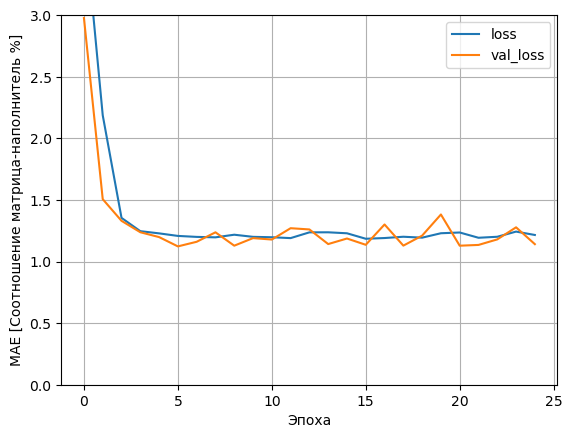

In [101]:
plot_loss(history)

In [102]:
test_results = {}
test_results['linear_model'] = linear_model.evaluate(
    test_features, test_labels, verbose=0)

In [103]:
test_results

{'linear_model': 1.0468029975891113}

### DNN Regression

In [104]:
model = keras.Sequential([
      normalizer,
      layers.Dense(64,activation='sigmoid'),
      layers.Dropout(0.5),
      layers.Dense(32, activation='sigmoid'),
      layers.Dense(1)
  ]) 

model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(0.001))

In [105]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_1 (Dense)             (None, 64)                832       
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2,970
Trainable params: 2,945
Non-trainable params: 25
___________________________________________________

In [106]:
history = model.fit(
    train_features, train_labels,
    validation_split=0.2,
    verbose=1, epochs=100)

Epoch 1/100
18/18 [==============================] - 0s 6ms/step - loss: 4.0280 - val_loss: 3.3928
Epoch 2/100
18/18 [==============================] - 0s 2ms/step - loss: 2.9031 - val_loss: 2.3628
Epoch 3/100
18/18 [==============================] - 0s 2ms/step - loss: 2.0199 - val_loss: 1.6493
Epoch 4/100
18/18 [==============================] - 0s 2ms/step - loss: 1.4963 - val_loss: 1.2824
Epoch 5/100
18/18 [==============================] - 0s 2ms/step - loss: 1.2785 - val_loss: 1.1387
Epoch 6/100
18/18 [==============================] - 0s 2ms/step - loss: 1.2124 - val_loss: 1.1065
Epoch 7/100
18/18 [==============================] - 0s 2ms/step - loss: 1.2003 - val_loss: 1.0959
Epoch 8/100
18/18 [==============================] - 0s 2ms/step - loss: 1.2001 - val_loss: 1.0915
Epoch 9/100
18/18 [==============================] - 0s 2ms/step - loss: 1.1950 - val_loss: 1.0914
Epoch 10/100
18/18 [==============================] - 0s 2ms/step - loss: 1.1849 - val_loss: 1.0937
Epoch 11/

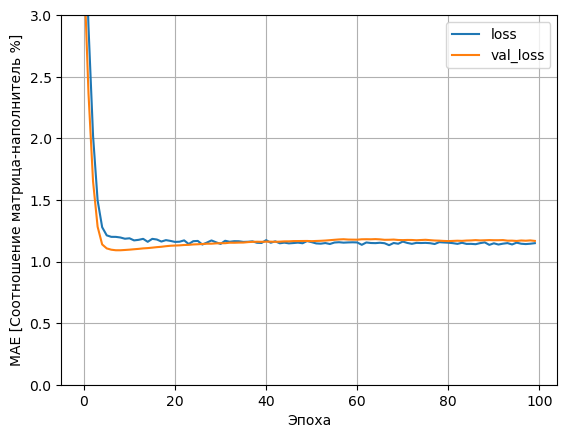

In [107]:
plot_loss(history)

In [108]:
test_results['dnn_model'] = model.evaluate(test_features, test_labels, verbose=0)

In [109]:
test_results 

{'linear_model': 1.0468029975891113, 'dnn_model': 1.0049800872802734}

In [110]:
pd.DataFrame(test_results, index=['Mean absolute error [Соотношение матрица-наполнитель %]']).T

,Mean absolute error [Соотношение матрица-наполнитель %]
linear_model,1.046803
dnn_model,1.004980


6/6 [==============================] - 0s 597us/step


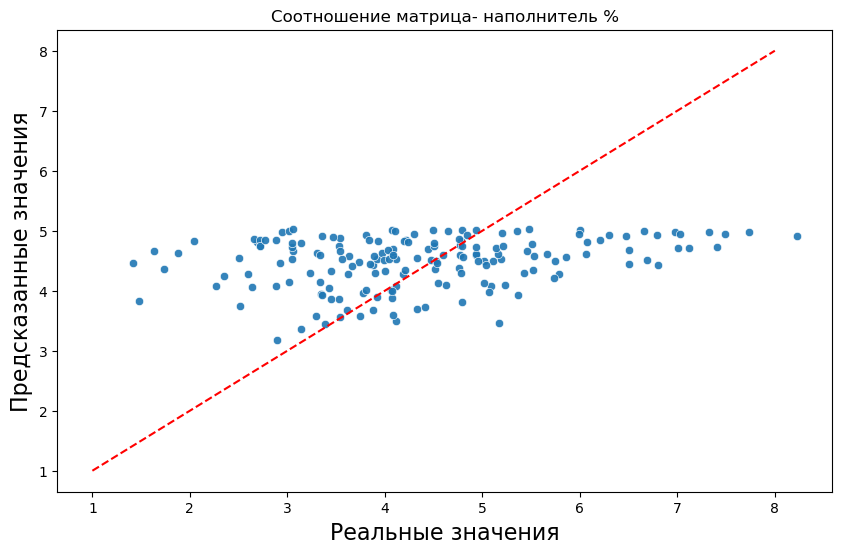

In [111]:
test_predictions = model.predict(test_features).flatten()
plt.figure(figsize=(10, 6))
sns.scatterplot(x=test_labels, y=test_predictions, alpha=0.9)
line_X = np.linspace(1, 8, 8)
line_Y = line_X
plt.plot(line_X, line_Y, 'r--')
plt.title("Соотношение матрица- наполнитель %", fontsize=12)
plt.xlabel('Реальные значения', fontsize=16)
plt.ylabel('Предсказанные значения', fontsize=16)
plt.show()

### Доп нейронная сеть прогноза "Прочность при растяжении, Мпа %"

In [112]:
train = df_dnn.sample(frac=0.8, random_state= 42)
test = df_dnn.drop(train.index)

train_features = train.copy()
test_features = test.copy()

train_labels = train_features.pop('Прочность при растяжении, МПа %')
test_labels = test_features.pop('Прочность при растяжении, МПа %')

print(train_labels.head(), test_labels.head(), train_features.head(), test_features.head())

98     4490.641453
548    3528.051081
263    3355.071936
280    4002.320526
956    4747.045670
Name: Прочность при растяжении, МПа %, dtype: float64 23    3632.990221
27    4401.510614
36    3351.707781
38    3993.694920
46    4216.209157
Name: Прочность при растяжении, МПа %, dtype: float64      Соотношение матрица-наполнитель %  Плотность, кг/м3 %  \
98                            2.943685         2710.766378   
548                           3.591091         2929.084772   
263                           4.809635         3040.903272   
280                           5.929988         3232.879561   
956                           4.065195         2626.810599   

     модуль упругости, ГПа %  Количество отвердителя, м.% %  \
98               1240.075911                     197.510157   
548              1358.388153                     153.638642   
263              1249.836033                     140.374501   
280               668.004878                     211.461515   
956               6

In [113]:
model = keras.Sequential([
      normalizer,
      layers.Dense(64,activation='relu'),
      layers.Dense(28, activation='relu'),
      layers.Dense(12, activation='relu'),
      layers.Dense(1)
  ]) 

model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(0.001))

In [114]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_4 (Dense)             (None, 64)                832       
                                                                 
 dense_5 (Dense)             (None, 28)                1820      
                                                                 
 dense_6 (Dense)             (None, 12)                348       
                                                                 
 dense_7 (Dense)             (None, 1)                 13        
                                                                 
Total params: 3,038
Trainable params: 3,013
Non-trainable params: 25
___________________________________________________

In [115]:
history = model.fit(
    train_features, train_labels,
    validation_split=0.2,
    verbose=1, epochs=200)

Epoch 1/200
18/18 [==============================] - 0s 5ms/step - loss: 3805.6526 - val_loss: 3797.7898
Epoch 2/200
18/18 [==============================] - 0s 2ms/step - loss: 3774.8884 - val_loss: 3755.9922
Epoch 3/200
18/18 [==============================] - 0s 2ms/step - loss: 3712.8767 - val_loss: 3663.7043
Epoch 4/200
18/18 [==============================] - 0s 2ms/step - loss: 3569.5342 - val_loss: 3445.7798
Epoch 5/200
18/18 [==============================] - 0s 2ms/step - loss: 3232.5491 - val_loss: 2950.1082
Epoch 6/200
18/18 [==============================] - 0s 2ms/step - loss: 2516.3357 - val_loss: 1983.3677
Epoch 7/200
18/18 [==============================] - 0s 2ms/step - loss: 1421.8202 - val_loss: 996.7916
Epoch 8/200
18/18 [==============================] - 0s 2ms/step - loss: 1038.1672 - val_loss: 958.3172
Epoch 9/200
18/18 [==============================] - 0s 2ms/step - loss: 966.3874 - val_loss: 898.6448
Epoch 10/200
18/18 [==============================] - 0s 2m

In [116]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([100, 3900])
    plt.xlabel('Эпоха')
    plt.ylabel('MAE [Прочность при растяжении, МПа %]')
    plt.legend()
    plt.grid(True)

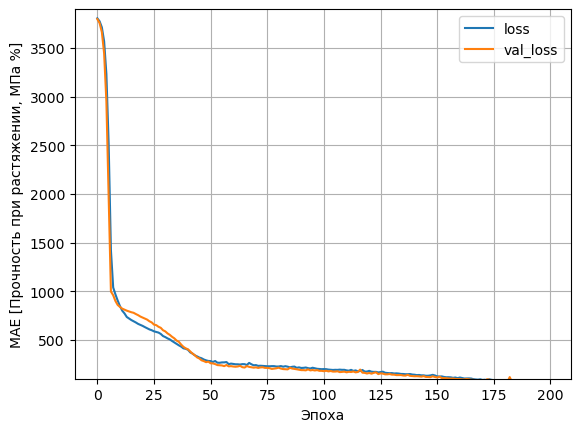

In [117]:
plot_loss(history)

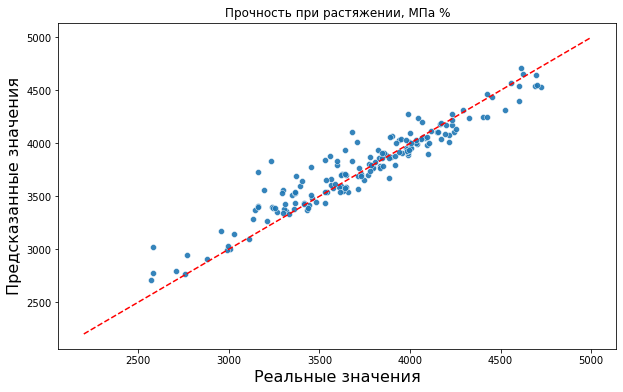

In [329]:
test_predictions = model.predict(test_features).flatten()
plt.figure(figsize=(10, 6))
sns.scatterplot(x=test_labels, y=test_predictions, alpha=0.9)
line_X = np.linspace(2200, 5000, 5000)
line_Y = line_X
plt.plot(line_X, line_Y, 'r--')
plt.title("Прочность при растяжении, МПа %", fontsize=12)
plt.xlabel('Реальные значения', fontsize=16)
plt.ylabel('Предсказанные значения', fontsize=16)
plt.show()